<a href="https://colab.research.google.com/github/giu-ferreira-cientista/SpotiScience/blob/main/SpotiScience.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SpotiScience - Conhecendo mais profundamente seu Artista Favorito no Spotify


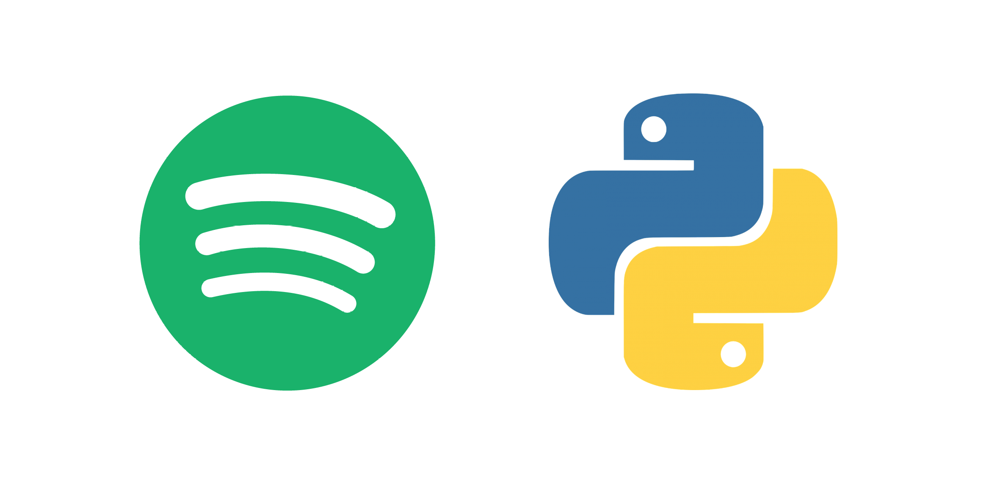

Falta fazer: 
- Inserir Insights ao longo do codigo
- Implantar Modelos ML
- Realizar Tunning nos Modelos
- Exportar o melhor Modelo
- Criar o Web App

Objetivo Final: Criar um WebApp para o usuário pesquisar por um nome de artista e receber a análise completa e as recomendações de outros artistas e músicas baseado nas features disponibilizadas pela API do Spotify.

Se quiser conversar sobre esse projeto basta me procurar pelo meu github (https://github.com/giu-ferreira-cientista)

# Importa as Bibliotecas e as Credenciais

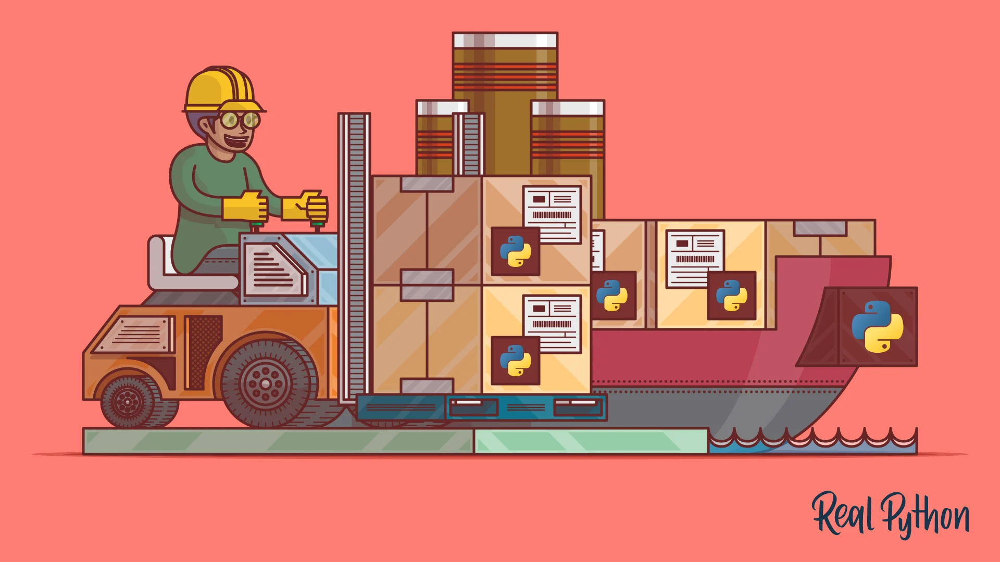

In [ ]:
#instala a biblioteca spotipy
!pip install spotipy

     |████████████████████████████████| 61kB 3.5MB/s 
     |████████████████████████████████| 143kB 31.3MB/s 
ERROR: google-colab 1.0.0 has requirement requests~=2.23.0, but you'll have requests 2.25.1 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
  Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
  Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0


In [ ]:
#instala as bibliotecas de Profiling 
!pip install sweetviz
!pip install DataProfiler

     |████████████████████████████████| 15.1MB 182kB/s 
     |████████████████████████████████| 81kB 8.4MB/s 
  Found existing installation: tqdm 4.41.1
    Uninstalling tqdm-4.41.1:
      Successfully uninstalled tqdm-4.41.1
     |████████████████████████████████| 7.4MB 5.4MB/s 
     |████████████████████████████████| 71kB 7.0MB/s 
     |████████████████████████████████| 61kB 5.0MB/s 
     |████████████████████████████████| 512kB 36.5MB/s 
     |████████████████████████████████| 2.3MB 37.7MB/s 
     |████████████████████████████████| 829kB 37.4MB/s 
  Created wheel for future: filename=future-0.18.2-cp37-none-any.whl size=491070 sha256=2bece8bcd48e32f9fb222bb81f23df0783428890160f27f4afb862e0934b06c2
  Stored in directory: /root/.cache/pip/wheels/8b/99/a0/81daf51dcd359a9377b110a8a886b3895921802d2fc1b2397e
Successfully built future
ERROR: google-colab 1.0.0 has requirement requests~=2.23.0, but you'll have requests 2.25.1 which is incompatible.
  Found existing installation: pytz 2018.9

In [ ]:
# LyricsGenius API
!pip install git+https://github.com/johnwmillr/LyricsGenius.git

  Cloning https://github.com/johnwmillr/LyricsGenius.git to /tmp/pip-req-build-3xxveot0
  Running command git clone -q https://github.com/johnwmillr/LyricsGenius.git /tmp/pip-req-build-3xxveot0
  Created wheel for lyricsgenius: filename=lyricsgenius-3.0.1-cp37-none-any.whl size=44690 sha256=f7024320ca3454b34743898624dc5df2075c728b5380825f022108c01bd969fa
  Stored in directory: /tmp/pip-ephem-wheel-cache-h7o01vc7/wheels/4c/c2/c2/711389881353cc8ef2f0055a712da5db9637132bc10151212e
Successfully built lyricsgenius


In [ ]:
# instala biblioteca de webscrapping beatifulsoup
!pip install bs4

In [ ]:
#importa as demais bibliotecas

# dataframes
import pandas as pd

#visualizacao
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import style
%matplotlib inline

#machinelearning
from sklearn.model_selection import cross_val_predict
from sklearn import metrics
from sklearn import svm
from sklearn import preprocessing

#profiling
import sweetviz as sv
from dataprofiler import Data, Profiler
import json

#timing
import time

#lyrics
import lyricsgenius

#counters
from collections import Counter

#wordclouds
from wordcloud import WordCloud, ImageColorGenerator

#nlp
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
nltk.download('stopwords')
nltk.download('punkt')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

# Entendendo a conexão com a API do Spotify

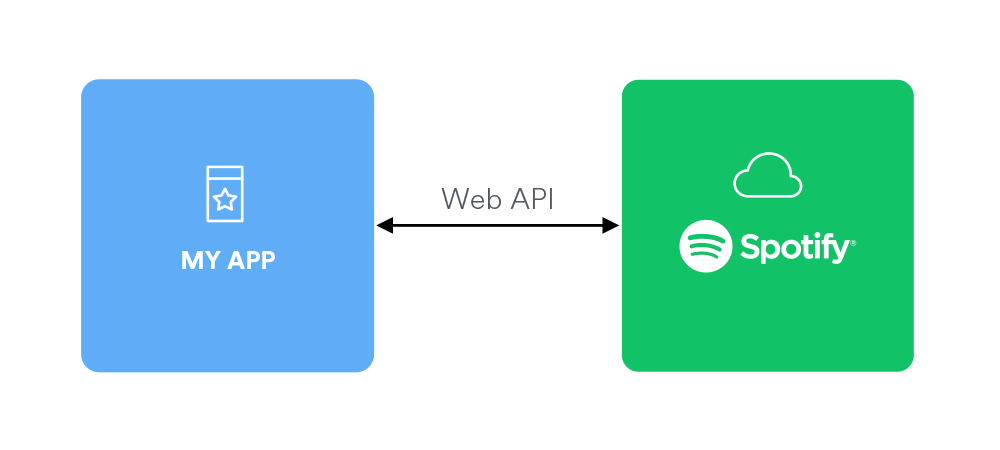

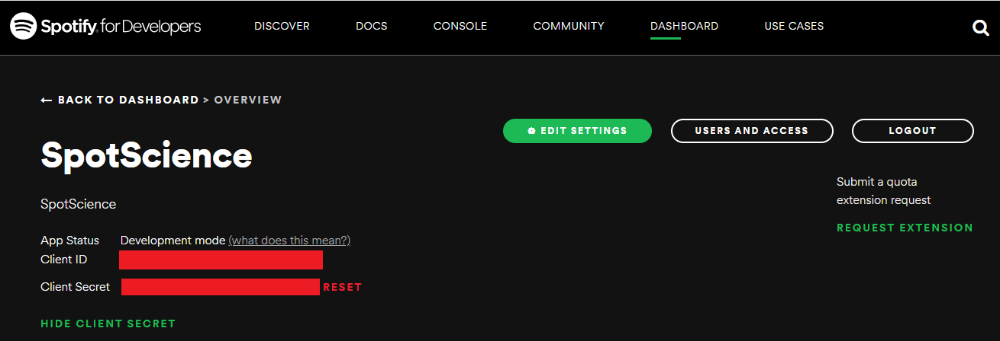

In [ ]:
#importa as bibliotecas e Credenciais do Spotify
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials 

client_id= "c3cb19f1185540a7b205cc6ad8708096"
client_secret= "83e4491016db47e68bc9885c280adf4d"

In [ ]:
#Instancia o Spotipy com as credenciais
client_credentials_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
#cliente para chamar as APIS
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager) 

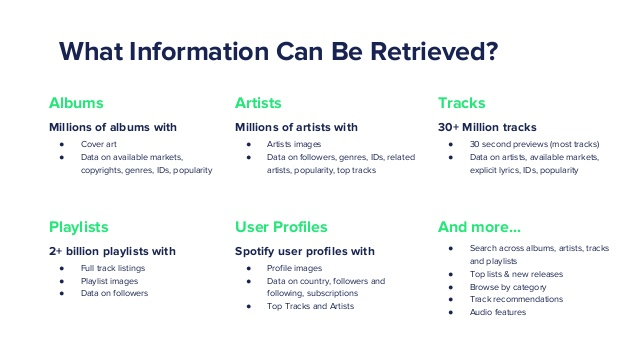

# Carrega a Base de Dados através da API do Spotify com todas as musicas de um determinado artista.

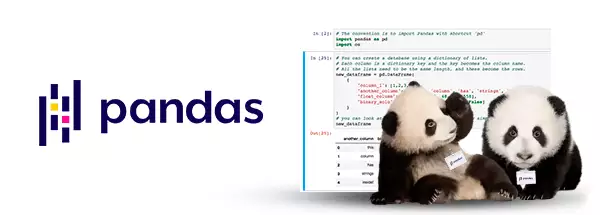



## Escolhe um Artista

In [ ]:
#Escolha um artista do Spotify:
ARTIST_NAME = "Bob Marley and The Wailers" 


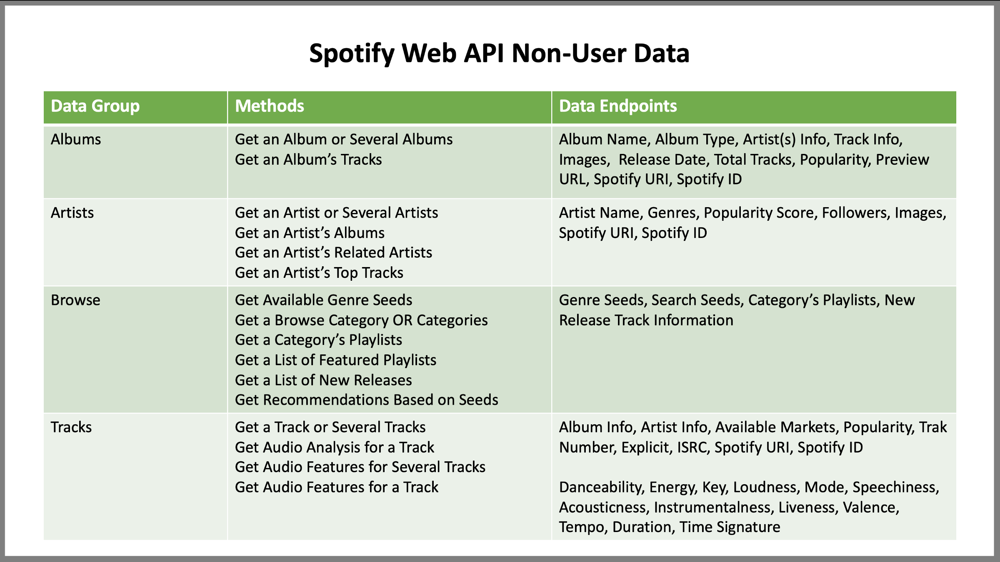

## Recupera o artista do Spotify

In [ ]:
def getArtistByName(artist_name):
  #Realiza a Busca
  result = sp.search(artist_name) 
  #Lista os Itens
  result['tracks']['items'][0]['artists']
  #Extraindo somente o id do artista
  artist_uri = result['tracks']['items'][0]['artists'][0]['id']
  return artist_uri

## Pega os Albuns do Artista

In [ ]:
def getArtistAlbuns(artist_uri, mode):
    #Buscando os albuns do artista
    sp_albums = sp.artist_albums(artist_uri, album_type='album')

    #armazena os nomes e os ids em listas diferentes
    album_names = []
    album_uris = []
    for i in range(len(sp_albums['items'])):
        album_names.append(sp_albums['items'][i]['name'])
        album_uris.append(sp_albums['items'][i]['uri'])
    if mode == 'id':
      return album_uris
    else: # 'name'
      return album_names  

## Pega as Musicas de um Album

In [ ]:
#busca as musicas de um album
def getAlbumSongs(uri, album_names, spotify_albums, album_count):
    #associa o id do album
    album = uri 
    #cria um dicionario pro album
    spotify_albums[album] = {} 
    #cria os campos que queremos controlar
    spotify_albums[album]['album'] = [] 
    spotify_albums[album]['track_number'] = []
    spotify_albums[album]['id'] = []
    spotify_albums[album]['name'] = []
    spotify_albums[album]['uri'] = []
    #chama a api pra pegar as musicas do album
    tracks = sp.album_tracks(album) 
    #para cada musica preenche os campos
    for n in range(len(tracks['items'])): 
            spotify_albums[album]['album'].append(album_names[album_count]) 
            spotify_albums[album]['track_number'].append(tracks['items'][n]['track_number'])
            spotify_albums[album]['id'].append(tracks['items'][n]['id'])
            spotify_albums[album]['name'].append(tracks['items'][n]['name'])
            spotify_albums[album]['uri'].append(tracks['items'][n]['uri'])

## Pega todos os Albuns do Artista

In [ ]:
def getAllAlbuns(album_uris, album_names, spotify_albums):
  #Varre todos os albums do artista e puxa as musicas
  album_count = 0
  #para cada album carrega as musicas e preenche as infos
  print('Inciando processamento dos Albuns...')
  for album in album_uris: 
      getAlbumSongs(album, album_names, spotify_albums, album_count)
      print("Album " + str(album_names[album_count]) + " foi processado")
      album_count+=1 
  return spotify_albums    

## Pega as features das musicas de um album 

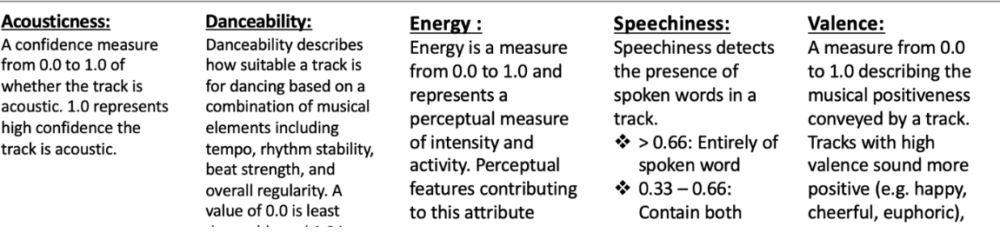

In [ ]:
#busca as features das musicas de um album
def audio_features(album, spotify_albums):
    #cria as listas pra armazenar os valores
    spotify_albums[album]['acousticness'] = []
    spotify_albums[album]['danceability'] = []
    spotify_albums[album]['energy'] = []
    spotify_albums[album]['instrumentalness'] = []
    spotify_albums[album]['liveness'] = []
    spotify_albums[album]['loudness'] = []
    spotify_albums[album]['speechiness'] = []
    spotify_albums[album]['tempo'] = []
    spotify_albums[album]['valence'] = []
    spotify_albums[album]['popularity'] = []
    # contador de musicas
    track_count = 0
    for track in spotify_albums[album]['uri']:
        #chama a api pra pegar as features 
        features = sp.audio_features(track)
        #adiciona as infos
        spotify_albums[album]['acousticness'].append(features[0]['acousticness'])
        spotify_albums[album]['danceability'].append(features[0]['danceability'])
        spotify_albums[album]['energy'].append(features[0]['energy'])
        spotify_albums[album]['instrumentalness'].append(features[0]['instrumentalness'])
        spotify_albums[album]['liveness'].append(features[0]['liveness'])
        spotify_albums[album]['loudness'].append(features[0]['loudness'])
        spotify_albums[album]['speechiness'].append(features[0]['speechiness'])
        spotify_albums[album]['tempo'].append(features[0]['tempo'])
        spotify_albums[album]['valence'].append(features[0]['valence'])
        #popularidade é armazenada separadamente
        pop = sp.track(track)
        spotify_albums[album]['popularity'].append(pop['popularity'])
        track_count+=1
    return spotify_albums

## Pega todas as features de todas as musicas do artista

In [ ]:
#busca todas as features de todas as musicas de todos os albuns do artista
def getAllTrackFeatures(spotify_albums):
  #Busca todas as features de cada musica de cada album
  sleep_min = 2
  sleep_max = 5
  #vamos medir o tempo de cada etapa
  start_time = time.time()
  request_count = 0
  #inicia o processamento
  print('Iniciando o processamento das musicas...')
  for i in spotify_albums:
      audio_features(i, spotify_albums)
      request_count+=1
      if request_count % 5 == 0:
          print(str(request_count) + " playlists processadas")
          time.sleep(np.random.uniform(sleep_min, sleep_max))
          print('Loop #: {}'.format(request_count))
          print('Tempo rodando: {} seconds'.format(time.time() - start_time))
  return spotify_albums        

## Cria o Dicionario com todos os Albuns

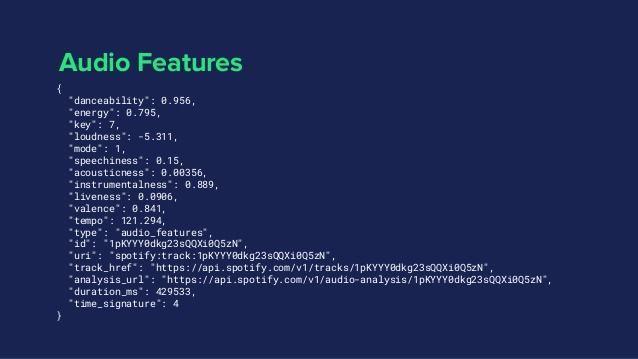

In [ ]:
def createAlbumDic(spotify_albums):
  dic_df = {}
  dic_df['album'] = []
  dic_df['track_number'] = []
  dic_df['id'] = []
  dic_df['name'] = []
  dic_df['uri'] = []
  dic_df['acousticness'] = []
  dic_df['danceability'] = []
  dic_df['energy'] = []
  dic_df['instrumentalness'] = []
  dic_df['liveness'] = []
  dic_df['loudness'] = []
  dic_df['speechiness'] = []
  dic_df['tempo'] = []
  dic_df['valence'] = []
  dic_df['popularity'] = []
  for album in spotify_albums: 
      for feature in spotify_albums[album]:
          dic_df[feature].extend(spotify_albums[album][feature])
  return dic_df  


## Cria o DataFrame com o Dicionario

In [ ]:
def createDataFrame(dic_df, ARTIST_NAME):
  #analisando o dataframe com as musicas e suas caracteristicas
  df = pd.DataFrame.from_dict(dic_df)
  df['artist'] = ARTIST_NAME
  return df

## Remove Duplicatas

In [ ]:
def removeDuplicates(df):
  #eliminando as duplicatas e imprimindo a quantidade
  final_df = df.sort_values('popularity', ascending=False).drop_duplicates('name').sort_index()
  return final_df

## Exporta o Dataframe para o Disco

In [ ]:
def exportDataFrameToExcel(final_df, artist_name):
  #exportando para o excel para persistir a base
  final_df.to_excel(artist_name + '.xlsx')

## Pré-Processa um Artista Completo

In [ ]:
def preProcessArtist(ARTIST_NAME):
  print('Iniciando processamento do Artista:', ARTIST_NAME) 
  # busca o artista
  artist_uri = getArtistByName(ARTIST_NAME)
  print('artist uri:',artist_uri)

  #ids dos albums do artista
  album_uris = getArtistAlbuns(artist_uri, 'id')
  print('Albuns uris:',album_uris)

  #nomes dos albuns do artista
  album_names = getArtistAlbuns(artist_uri, 'name')
  print('Albuns names:',album_names)
 
  #busca todas as features de cada musica
  #cria o dicionario de dados
  spotify_albums = {}
 
  #busca todos os albums
  spotify_albums = getAllAlbuns(album_uris, album_names, spotify_albums)
 
  #busca todas as features
  spotify_albums = getAllTrackFeatures(spotify_albums)
 
  #cria o dicionario
  dic_df = createAlbumDic(spotify_albums)

  #quantas musicas foram encontradas no nosso dicionario
  print('Músicas encontradas:',len(dic_df['album']))

  #converte para dataframe
  df_artist = createDataFrame(dic_df, ARTIST_NAME)

  #remove as duplicatas
  df_artist = removeDuplicates(df_artist)

  #quantas musicas foram encontradas no nosso dataframe
  print('Músicas após remocao de duplicatas:',len(df_artist))

  #lista as musicas que foram encontradas do artista
  print('Lista de Músicas Encontradas do Artista:', df_artist['name'])

  #exporta o dataframe para formato Excel em disco
  exportDataFrameToExcel(df_artist,ARTIST_NAME)

  print('DataFrame Exportado para Disco. Procure pelo arquivo', ARTIST_NAME,'.xslx no seu disco.')
  

## Executa todo o Pré-Processamento

In [ ]:
#processa todos os dados do artista
preProcessArtist(ARTIST_NAME)

Iniciando processamento do Artista: Bob Marley and The Wailers
artist uri: 2QsynagSdAqZj3U9HgDzjD
Albuns uris: ['spotify:album:2M9E6uD6mYqRFTjqcaVzzC', 'spotify:album:3lxHj7xzLBkPpg98eJ7G8B', 'spotify:album:0KI2QGv4bRgVsab4fR4XLn', 'spotify:album:3DZmcdIS8JlZwYFhbN9Pbc', 'spotify:album:4mFwVyByhtRgdrjtO5tZr2', 'spotify:album:1lBmb7nfOeFqTDN6gQLFMx', 'spotify:album:52NaVc6LFCFKWofNwDnpMN', 'spotify:album:1VFrH2lUWZRDR4WhG8UvvE', 'spotify:album:7skxAMJF6nQH5OAs8GoHSJ', 'spotify:album:0t7epGcMFSPS98X9t9atfk', 'spotify:album:6afNyQUOvygSxHshPynmHN', 'spotify:album:2i89WN8gz7w7utOWGfs8oD', 'spotify:album:4N3FRWAVeD4mWSgIpitOVw', 'spotify:album:4hV6TxaUkzEi4wUN6Fd0s7', 'spotify:album:6jdQTtTfKOQkbhgTiCB6Uo', 'spotify:album:2TLQUqsB5corFWahk3ZLMr', 'spotify:album:2VEAzNd6gi3lVQqNKVQwWD', 'spotify:album:6RHfKsY9RHL5FSvYmODqpP', 'spotify:album:6GGOPGtT3AQMCgeHh5hPMA', 'spotify:album:7MsUS81xOJbxppxEal9aIS']
Albuns names: ['Live At The Rainbow, 4th June 1977 (Remastered 2020)', 'Exodus 40', 'Exo

# Análise Exploratória dos Dados

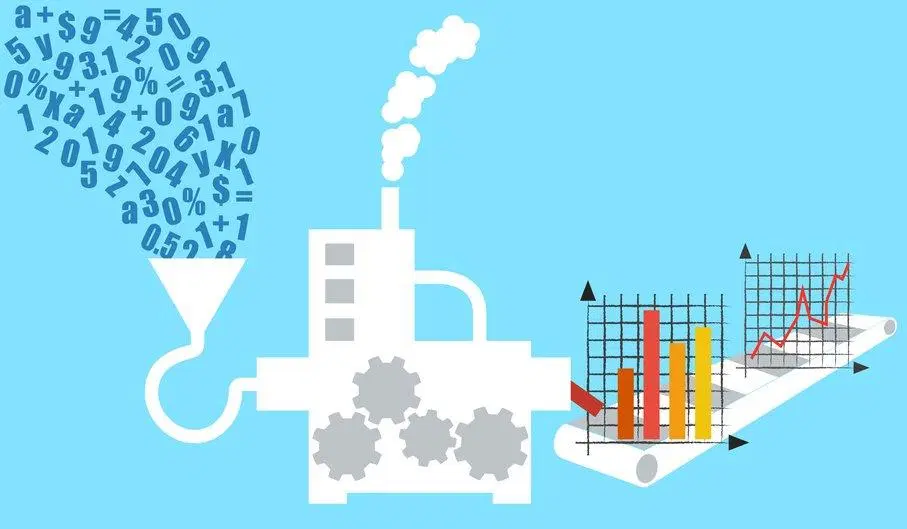

## Conhecendo a base de Dados

In [ ]:
#Visualizar todas as linhas das tabelas no colab
pd.set_option('display.max_rows', None)

In [ ]:
#importando os dados da planilha persistida pro dataframe
df_artist = pd.read_excel(ARTIST_NAME + '.xlsx')
df_artist.shape

(269, 17)

In [ ]:
#conhecendo os tipos de campos
df_artist.dtypes

Unnamed: 0            int64
album                object
track_number          int64
id                   object
name                 object
uri                  object
acousticness        float64
danceability        float64
energy              float64
instrumentalness    float64
liveness            float64
loudness            float64
speechiness         float64
tempo               float64
valence             float64
popularity            int64
artist               object
dtype: object

In [ ]:
#Lista o Dataframe
df_artist.reset_index(inplace=True)
df_artist

,index,Unnamed: 0,album,track_number,id,name,uri,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,artist
0,0,0,"Live At The Rainbow, 4th June 1977 (Remastered...",1,2UNVYvFO54bTRzlTTxQFiq,"Trenchtown Rock - Live At The Rainbow Theatre,...",spotify:track:2UNVYvFO54bTRzlTTxQFiq,0.208000,0.492,0.8730,0.000002,0.9960,-7.962,0.2030,158.604,0.716,42,Bob Marley and The Wailers
1,1,1,"Live At The Rainbow, 4th June 1977 (Remastered...",2,3c7Da9fXaBm1RXpsAWPcJM,Rebel Music (3 O’Clock Roadblock) - Live At Th...,spotify:track:3c7Da9fXaBm1RXpsAWPcJM,0.299000,0.470,0.8140,0.000869,0.9840,-7.571,0.1820,169.621,0.765,41,Bob Marley and The Wailers
2,2,2,"Live At The Rainbow, 4th June 1977 (Remastered...",3,5D3bB3mxLO452yqGDpuuab,Burnin' And Lootin' - Live At The Rainbow Thea...,spotify:track:5D3bB3mxLO452yqGDpuuab,0.309000,0.532,0.8030,0.000032,0.8580,-7.213,0.2460,142.346,0.733,40,Bob Marley and The Wailers
3,3,3,"Live At The Rainbow, 4th June 1977 (Remastered...",4,4nOqf5eoXUVMd8C9FwjZ5P,Them Belly Full (But We Hungry) - Live At The ...,spotify:track:4nOqf5eoXUVMd8C9FwjZ5P,0.317000,0.495,0.8900,0.000010,0.9680,-7.326,0.3280,158.357,0.629,40,Bob Marley and The Wailers
4,4,4,"Live At The Rainbow, 4th June 1977 (Remastered...",5,0ZUHgyLQjKoT1r5c3vEN5B,"The Heathen - Live At The Rainbow Theatre, Lon...",spotify:track:0ZUHgyLQjKoT1r5c3vEN5B,0.207000,0.489,0.8290,0.006800,0.7300,-7.656,0.0805,150.943,0.503,40,Bob Marley and The Wailers
5,5,5,"Live At The Rainbow, 4th June 1977 (Remastered...",6,4XHYqVhME8nS3i9er4YFbI,I Shot The Sheriff - Live At The Rainbow Theat...,spotify:track:4XHYqVhME8nS3i9er4YFbI,0.330000,0.474,0.8030,0.000032,0.8660,-7.081,0.0619,85.209,0.718,39,Bob Marley and The Wailers
6,6,6,"Live At The Rainbow, 4th June 1977 (Remastered...",7,1nbG7l67karh4qccDcQ68Y,War / No More Trouble - Live At The Rainbow Th...,spotify:track:1nbG7l67karh4qccDcQ68Y,0.149000,0.660,0.7520,0.000000,0.9810,-7.404,0.2260,88.247,0.541,39,Bob Marley and The Wailers
7,7,7,"Live At The Rainbow, 4th June 1977 (Remastered...",8,411PukN4UekPx23t979Oe7,Crazy Baldhead / Running Away - Live At The Ra...,spotify:track:411PukN4UekPx23t979Oe7,0.256000,0.719,0.7190,0.000008,0.9600,-8.992,0.0673,133.081,0.849,38,Bob Marley and The Wailers
8,8,8,"Live At The Rainbow, 4th June 1977 (Remastered...",9,1oBuc3kRjbar1VzQTK5TO3,"No Woman, No Cry - Live At The Rainbow Theatre...",spotify:track:1oBuc3kRjbar1VzQTK5TO3,0.198000,0.484,0.5770,0.000091,0.8550,-8.029,0.0368,135.765,0.528,38,Bob Marley and The Wailers
9,9,9,"Live At The Rainbow, 4th June 1977 (Remastered...",10,22ySrutJ1OvZdzVwmTe5Ih,Lively Up Yourself - Live At The Rainbow Theat...,spotify:track:22ySrutJ1OvZdzVwmTe5Ih,0.166000,0.395,0.9080,0.002460,0.9820,-7.439,0.2700,169.668,0.487,37,Bob Marley and The Wailers


In [ ]:
#Lista as Colunas
df_artist.columns

Index(['index', 'Unnamed: 0', 'album', 'track_number', 'id', 'name', 'uri',
       'acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence', 'popularity',
       'artist'],
      dtype='object')

In [ ]:
#Dropa as colunas desnecessarias
df_artist = df_artist.drop(['index','Unnamed: 0'], axis= 1)

In [ ]:
#listando as primeiras linhas
df_artist.head()

,album,track_number,id,name,uri,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,artist
0,"Live At The Rainbow, 4th June 1977 (Remastered...",1,2UNVYvFO54bTRzlTTxQFiq,"Trenchtown Rock - Live At The Rainbow Theatre,...",spotify:track:2UNVYvFO54bTRzlTTxQFiq,0.208,0.492,0.873,0.000002,0.996,-7.962,0.2030,158.604,0.716,42,Bob Marley and The Wailers
1,"Live At The Rainbow, 4th June 1977 (Remastered...",2,3c7Da9fXaBm1RXpsAWPcJM,Rebel Music (3 O’Clock Roadblock) - Live At Th...,spotify:track:3c7Da9fXaBm1RXpsAWPcJM,0.299,0.470,0.814,0.000869,0.984,-7.571,0.1820,169.621,0.765,41,Bob Marley and The Wailers
2,"Live At The Rainbow, 4th June 1977 (Remastered...",3,5D3bB3mxLO452yqGDpuuab,Burnin' And Lootin' - Live At The Rainbow Thea...,spotify:track:5D3bB3mxLO452yqGDpuuab,0.309,0.532,0.803,0.000032,0.858,-7.213,0.2460,142.346,0.733,40,Bob Marley and The Wailers
3,"Live At The Rainbow, 4th June 1977 (Remastered...",4,4nOqf5eoXUVMd8C9FwjZ5P,Them Belly Full (But We Hungry) - Live At The ...,spotify:track:4nOqf5eoXUVMd8C9FwjZ5P,0.317,0.495,0.890,0.000010,0.968,-7.326,0.3280,158.357,0.629,40,Bob Marley and The Wailers
4,"Live At The Rainbow, 4th June 1977 (Remastered...",5,0ZUHgyLQjKoT1r5c3vEN5B,"The Heathen - Live At The Rainbow Theatre, Lon...",spotify:track:0ZUHgyLQjKoT1r5c3vEN5B,0.207,0.489,0.829,0.006800,0.730,-7.656,0.0805,150.943,0.503,40,Bob Marley and The Wailers


In [ ]:
#informacoes do dataframe
df_artist.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 269 entries, 0 to 268
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   album             269 non-null    object 
 1   track_number      269 non-null    int64  
 2   id                269 non-null    object 
 3   name              269 non-null    object 
 4   uri               269 non-null    object 
 5   acousticness      269 non-null    float64
 6   danceability      269 non-null    float64
 7   energy            269 non-null    float64
 8   instrumentalness  269 non-null    float64
 9   liveness          269 non-null    float64
 10  loudness          269 non-null    float64
 11  speechiness       269 non-null    float64
 12  tempo             269 non-null    float64
 13  valence           269 non-null    float64
 14  popularity        269 non-null    int64  
 15  artist            269 non-null    object 
dtypes: float64(9), int64(2), object(5)
memory us

In [ ]:
#descricao estatistica do dataframe
df_artist.describe()

,track_number,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
count,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000
mean,7.869888,0.327712,0.680680,0.582588,0.092383,0.347133,-9.633636,0.132954,121.035086,0.698457,27.330855
std,4.952930,0.291326,0.132597,0.195275,0.234158,0.310532,3.978231,0.121451,29.144429,0.194726,11.981259
min,1.000000,0.000010,0.247000,0.058500,0.000000,0.022700,-25.313000,0.026200,60.855000,0.149000,0.000000
25%,4.000000,0.074300,0.595000,0.437000,0.000002,0.101000,-11.192000,0.054900,98.221000,0.571000,15.000000
50%,7.000000,0.250000,0.698000,0.588000,0.000128,0.211000,-8.656000,0.084300,124.611000,0.723000,28.000000
75%,11.000000,0.515000,0.774000,0.749000,0.006800,0.595000,-6.997000,0.176000,138.934000,0.852000,35.000000
max,24.000000,0.985000,0.979000,0.975000,0.930000,0.996000,-2.755000,0.940000,213.353000,0.973000,63.000000


In [ ]:
#Numero de artistas na base
df_artist.artist.unique()


array(['Bob Marley and The Wailers'], dtype=object)

## Agrupando Informações

In [ ]:
#Agrupando as musicas por albuns
df_artist['album'].value_counts()

Live Forever: The Stanley Theatre, Pittsburgh, PA, 9/23/1980     25
Marley (The Original Soundtrack)                                 19
Roots, Rock, Remixed: The Complete Sessions                      19
Destiny: Rare Sides From Studio One                              18
The Wailing Wailers at Studio One                                18
Legend Remixed                                                   17
Simmer Down at Studio One                                        16
Another Dance: Rarities From Studio One                          15
Exodus 40 (40th Anniversary Deluxe Edition)                      15
Talkin' Blues                                                    15
Live At The Rainbow, 4th June 1977 (Remastered 2020)             13
Live At The Roxy - The Complete Concert                          13
Easy Skanking In Boston '78                                      13
Chant Down Babylon                                               12
Dreams Of Freedom (Ambient Translations Of Bob M

In [ ]:
#verificando o tempo das musicas por album 
df_artist.query('album == "Exodus 40"' )['tempo'].value_counts()

81.253     1
132.808    1
131.262    1
149.231    1
142.329    1
123.601    1
121.170    1
135.723    1
123.428    1
76.839     1
Name: tempo, dtype: int64

In [ ]:
#Confirmando se tem duplicatas pelo nome da musica
df_artist['name'].value_counts()

Burnin' & Lootin' - Live At The Record Plant, 1973                                  1
Them Belly Full - Live At Music Hall, Boston / 1978                                 1
Bend Down Low - Alternate Version                                                   1
Sinner Man                                                                          1
Waiting In Vain - Exodus 40 Mix                                                     1
Treat Me Good                                                                       1
Where's the Girl for Me                                                             1
Steppin’ Out Of Babylon - Live at the Stanley Theatre - 9/23/1980                   1
Natural Mystic - Exodus 40 Mix                                                      1
Rebel Music (3 O'Clock Roadblock) - Bill Laswell Remix                              1
True Confession                                                                     1
Burnin' And Lootin' - Live At Rainbow Theatre, London 

## Fazendo Buscas na Base

In [ ]:
#define uma string de busca com o nome do album
qry_album = 'Chant Down Babylon'

In [ ]:
#faz a query no dataframe procurando pelas condicoes
df_artist.query('album in @qry_album')

,album,track_number,id,name,uri,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,artist
170,Chant Down Babylon,1,6zi8kGpTadjpsLCO4jvMsH,No More Trouble,spotify:track:6zi8kGpTadjpsLCO4jvMsH,0.00851,0.753,0.607,0.000076,0.1670,-6.266,0.1420,142.239,0.577,45,Bob Marley and The Wailers
171,Chant Down Babylon,2,6L6U3Kj80wV1uY6zXd9TjS,Rebel Music,spotify:track:6L6U3Kj80wV1uY6zXd9TjS,0.04690,0.758,0.544,0.000000,0.2430,-5.929,0.0730,152.436,0.627,45,Bob Marley and The Wailers
172,Chant Down Babylon,3,2VV8FFo51CLESGnLhXoVox,Johnny Was,spotify:track:2VV8FFo51CLESGnLhXoVox,0.00255,0.741,0.767,0.000000,0.2010,-2.958,0.0347,86.584,0.791,44,Bob Marley and The Wailers
173,Chant Down Babylon,4,0U3D4rKdDG4Sf8pObxhq58,Concrete Jungle,spotify:track:0U3D4rKdDG4Sf8pObxhq58,0.05610,0.801,0.565,0.000291,0.1200,-6.894,0.1370,96.635,0.723,42,Bob Marley and The Wailers
174,Chant Down Babylon,5,196bjfNXvEDkODWVjq2RRN,Rastaman Chant,spotify:track:196bjfNXvEDkODWVjq2RRN,0.07300,0.831,0.687,0.000005,0.2730,-5.080,0.2190,95.664,0.549,56,Bob Marley and The Wailers
175,Chant Down Babylon,6,14i9rdaGx75kDf9OyzKlZk,Guiltiness,spotify:track:14i9rdaGx75kDf9OyzKlZk,0.02250,0.640,0.647,0.000000,0.2450,-5.883,0.3090,84.871,0.626,43,Bob Marley and The Wailers
176,Chant Down Babylon,7,7I1fHMDNlHobS8SBUJAUDt,Turn Your Lights Down Low,spotify:track:7I1fHMDNlHobS8SBUJAUDt,0.01370,0.733,0.668,0.000002,0.0393,-5.300,0.0685,83.110,0.713,63,Bob Marley and The Wailers
177,Chant Down Babylon,8,38oIp9y5zW2ylFE3y7MKaP,Jammin',spotify:track:38oIp9y5zW2ylFE3y7MKaP,0.00802,0.759,0.721,0.000000,0.1320,-4.450,0.1110,83.510,0.587,51,Bob Marley and The Wailers
178,Chant Down Babylon,9,4y0mygDmFnEaAvWBRd3EMQ,Kinky Reggae,spotify:track:4y0mygDmFnEaAvWBRd3EMQ,0.01940,0.817,0.703,0.000000,0.0985,-4.554,0.2910,139.048,0.687,42,Bob Marley and The Wailers
179,Chant Down Babylon,10,6B45oUBd8uqLzoVw49WlIt,"Roots, Rock, Reggae",spotify:track:6B45oUBd8uqLzoVw49WlIt,0.01470,0.755,0.733,0.000000,0.0554,-5.037,0.1450,81.988,0.888,42,Bob Marley and The Wailers


In [ ]:
#se quiser procurar por apenas uma parte do nome 
qry_album = 'Babylon'
df_artist[df_artist['album'].str.contains(qry_album)]

,album,track_number,id,name,uri,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,artist
170,Chant Down Babylon,1,6zi8kGpTadjpsLCO4jvMsH,No More Trouble,spotify:track:6zi8kGpTadjpsLCO4jvMsH,0.00851,0.753,0.607,0.000076,0.1670,-6.266,0.1420,142.239,0.577,45,Bob Marley and The Wailers
171,Chant Down Babylon,2,6L6U3Kj80wV1uY6zXd9TjS,Rebel Music,spotify:track:6L6U3Kj80wV1uY6zXd9TjS,0.04690,0.758,0.544,0.000000,0.2430,-5.929,0.0730,152.436,0.627,45,Bob Marley and The Wailers
172,Chant Down Babylon,3,2VV8FFo51CLESGnLhXoVox,Johnny Was,spotify:track:2VV8FFo51CLESGnLhXoVox,0.00255,0.741,0.767,0.000000,0.2010,-2.958,0.0347,86.584,0.791,44,Bob Marley and The Wailers
173,Chant Down Babylon,4,0U3D4rKdDG4Sf8pObxhq58,Concrete Jungle,spotify:track:0U3D4rKdDG4Sf8pObxhq58,0.05610,0.801,0.565,0.000291,0.1200,-6.894,0.1370,96.635,0.723,42,Bob Marley and The Wailers
174,Chant Down Babylon,5,196bjfNXvEDkODWVjq2RRN,Rastaman Chant,spotify:track:196bjfNXvEDkODWVjq2RRN,0.07300,0.831,0.687,0.000005,0.2730,-5.080,0.2190,95.664,0.549,56,Bob Marley and The Wailers
175,Chant Down Babylon,6,14i9rdaGx75kDf9OyzKlZk,Guiltiness,spotify:track:14i9rdaGx75kDf9OyzKlZk,0.02250,0.640,0.647,0.000000,0.2450,-5.883,0.3090,84.871,0.626,43,Bob Marley and The Wailers
176,Chant Down Babylon,7,7I1fHMDNlHobS8SBUJAUDt,Turn Your Lights Down Low,spotify:track:7I1fHMDNlHobS8SBUJAUDt,0.01370,0.733,0.668,0.000002,0.0393,-5.300,0.0685,83.110,0.713,63,Bob Marley and The Wailers
177,Chant Down Babylon,8,38oIp9y5zW2ylFE3y7MKaP,Jammin',spotify:track:38oIp9y5zW2ylFE3y7MKaP,0.00802,0.759,0.721,0.000000,0.1320,-4.450,0.1110,83.510,0.587,51,Bob Marley and The Wailers
178,Chant Down Babylon,9,4y0mygDmFnEaAvWBRd3EMQ,Kinky Reggae,spotify:track:4y0mygDmFnEaAvWBRd3EMQ,0.01940,0.817,0.703,0.000000,0.0985,-4.554,0.2910,139.048,0.687,42,Bob Marley and The Wailers
179,Chant Down Babylon,10,6B45oUBd8uqLzoVw49WlIt,"Roots, Rock, Reggae",spotify:track:6B45oUBd8uqLzoVw49WlIt,0.01470,0.755,0.733,0.000000,0.0554,-5.037,0.1450,81.988,0.888,42,Bob Marley and The Wailers


In [ ]:
#Buscando apenas as musicas com uma certa palavra
df_babylon = df_artist.loc[df_artist['name'].str.contains('Reggae')]
df_babylon

,album,track_number,id,name,uri,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,artist
65,Legend Remixed,15,7p71nLe7SBlF27rB45ikQq,Punky Reggae Party - Z-Trip Remix featuring Le...,spotify:track:7p71nLe7SBlF27rB45ikQq,0.00640,0.785,0.719,0.003250,0.5060,-6.973,0.0566,143.915,0.399,19,Bob Marley and The Wailers
67,Legend Remixed,17,0APuImo2e7fQzFbgpIkfZ9,Punky Reggae Party Dub Mix - Z-Trip Remix feat...,spotify:track:0APuImo2e7fQzFbgpIkfZ9,0.00107,0.741,0.712,0.764000,0.3410,-7.718,0.0604,143.962,0.266,18,Bob Marley and The Wailers
166,Live At The Roxy - The Complete Concert,10,5MaJEV9ZROFKs7swyLKYlX,"Roots, Rock, Reggae - Live At The Roxy",spotify:track:5MaJEV9ZROFKs7swyLKYlX,0.43000,0.687,0.693,0.000003,0.9630,-6.578,0.1290,135.405,0.815,29,Bob Marley and The Wailers
178,Chant Down Babylon,9,4y0mygDmFnEaAvWBRd3EMQ,Kinky Reggae,spotify:track:4y0mygDmFnEaAvWBRd3EMQ,0.01940,0.817,0.703,0.000000,0.0985,-4.554,0.2910,139.048,0.687,42,Bob Marley and The Wailers
179,Chant Down Babylon,10,6B45oUBd8uqLzoVw49WlIt,"Roots, Rock, Reggae",spotify:track:6B45oUBd8uqLzoVw49WlIt,0.01470,0.755,0.733,0.000000,0.0554,-5.037,0.1450,81.988,0.888,42,Bob Marley and The Wailers
257,Talkin' Blues,6,4gmkih4i1HL7GPHG1iNTWm,"Kinky Reggae - Live At The Record Plant, 1973",spotify:track:4gmkih4i1HL7GPHG1iNTWm,0.15000,0.727,0.530,0.003750,0.0990,-10.376,0.4530,80.042,0.764,38,Bob Marley and The Wailers


## Plotando Visualizações

### Músicas por Álbum

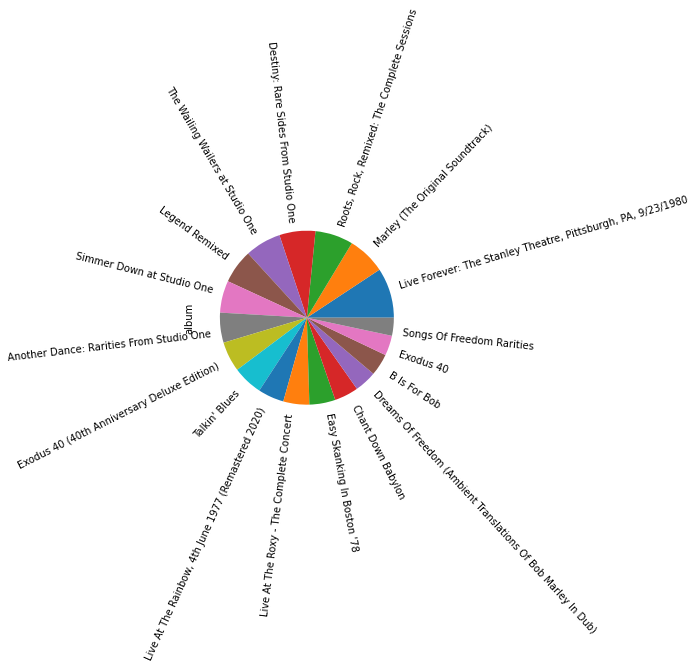

In [ ]:
#Agrupando as musicas por albuns num grafico de pizza
df_artist['album'].value_counts().plot.pie(rotatelabels=True)

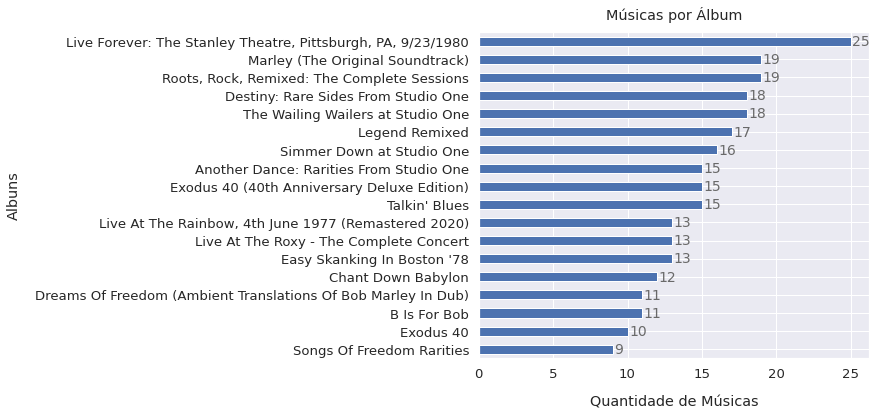

In [ ]:
# agrupando as musicas por albuns com um grafico de barras horizontais ordenado e com valores
sns.set(font_scale=1.2)
bar = df_artist['album'].value_counts().plot(kind='barh', figsize=(7, 6), rot=0)
plt.xlabel("Quantidade de Músicas", labelpad=14)
plt.ylabel("Albuns", labelpad=14)
plt.title("Músicas por Álbum", y=1.02);

# ordena os registros de cima pra baixo
bar.invert_yaxis()

# cria uma lista para coletar os valores dos rotulos
totals = []

# coleta os valores
for i in bar.patches:
    totals.append(i.get_width())

# seta os labels individuais
for i in bar.patches:
    # usa o get_width pra alinhar a esquerda e get_y para alinhar a altura
    bar.text(i.get_width()+.10, i.get_y()+.48, \
            str(i.get_width()), fontsize=14, color='dimgrey')
    

### Distribuição das Features das Músicas

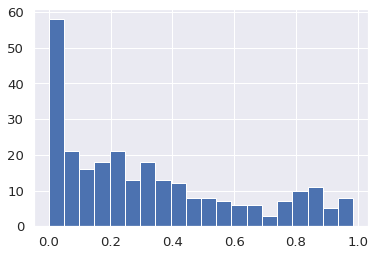

In [ ]:
#distribuicao dos valores da variavel acousticness
df_artist['acousticness'].hist(bins = 20)

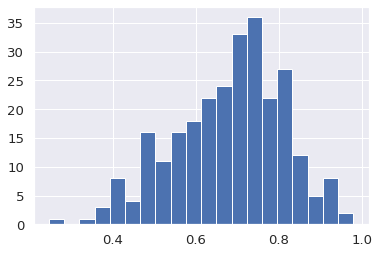

In [ ]:
#distribuicao dos valores da variavel danceability
df_artist['danceability'].hist(bins = 20)

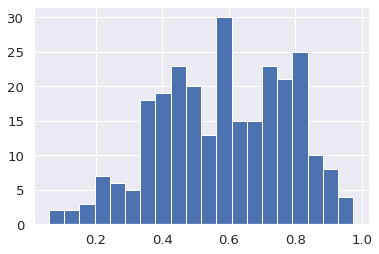

In [ ]:
#distribuicao dos valores da variavel energy
df_artist['energy'].hist(bins = 20)

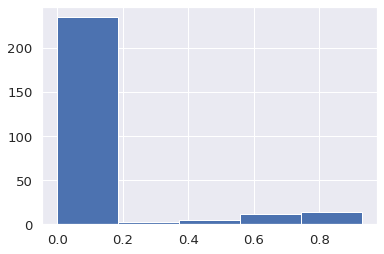

In [ ]:
#distribuicao dos valores da variavel instrumentalness
df_artist['instrumentalness'].hist(bins = 5)

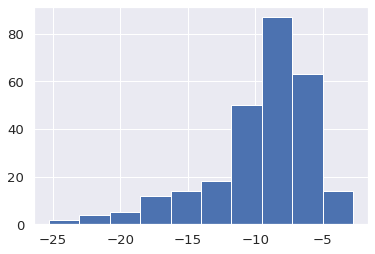

In [ ]:
#distribuicao dos valores da variavel loudness
df_artist['loudness'].hist(bins = 10)

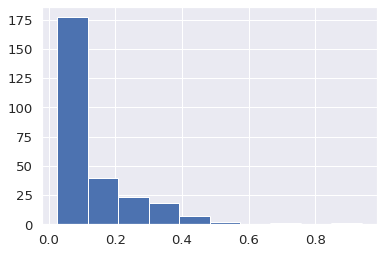

In [ ]:
#distribuicao dos valores da variavel speechiness
df_artist['speechiness'].hist(bins = 10)

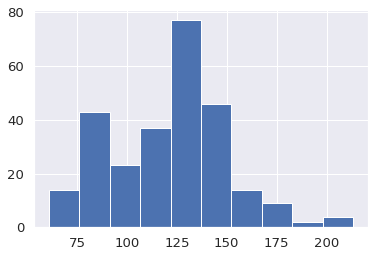

In [ ]:
#distribuicao dos valores da variavel tempo
df_artist['tempo'].hist(bins = 10)

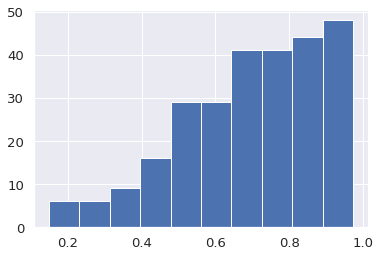

In [ ]:
#distribuicao dos valores da variavel valence
df_artist['valence'].hist(bins = 10)

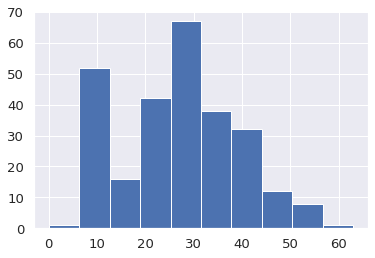

In [ ]:
#distribuicao dos valores da variavel popularity
df_artist['popularity'].hist(bins = 10)

### Variação nos Dados das Features

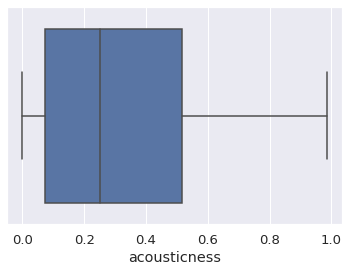

In [ ]:
#variacao dos dados na variavel acousticness
sns.boxplot(x='acousticness', data=df_artist)

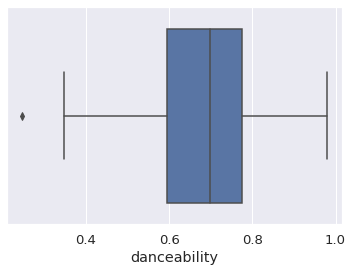

In [ ]:
#variacao dos dados na variavel acousticness
sns.boxplot(x='danceability', data=df_artist)

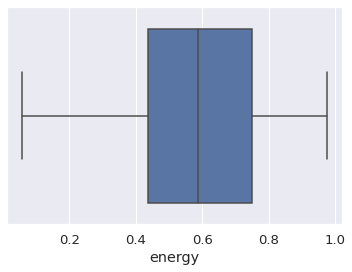

In [ ]:
#variacao dos dados na variavel acousticness
sns.boxplot(x='energy', data=df_artist)

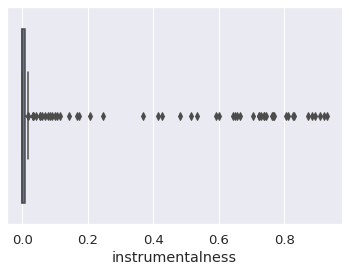

In [ ]:
#variacao dos dados na variavel acousticness
sns.boxplot(x='instrumentalness', data=df_artist)

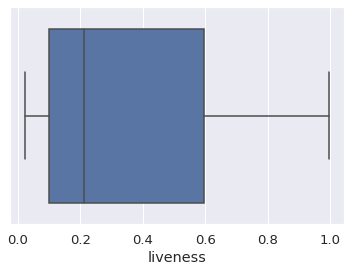

In [ ]:
#variacao dos dados na variavel liveness
sns.boxplot(x='liveness', data=df_artist)

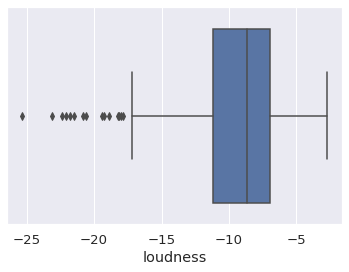

In [ ]:
#variacao dos dados na variavel acousticness
sns.boxplot(x='loudness', data=df_artist)

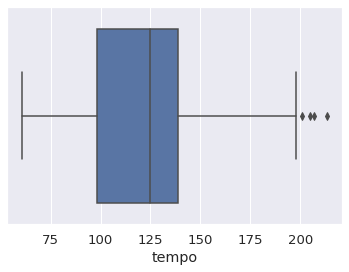

In [ ]:
#variacao dos dados na variavel acousticness
sns.boxplot(x='tempo', data=df_artist)

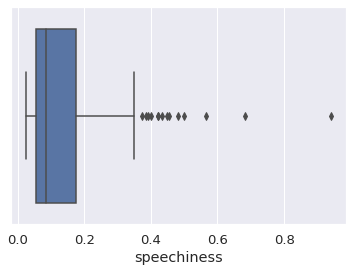

In [ ]:
#variacao dos dados na variavel acousticness
sns.boxplot(x='speechiness', data=df_artist)

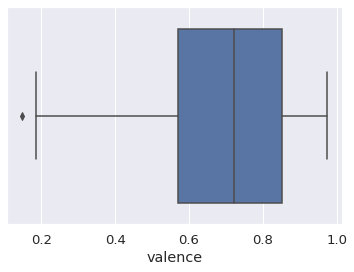

In [ ]:
#variacao dos dados na variavel acousticness
sns.boxplot(x='valence', data=df_artist)

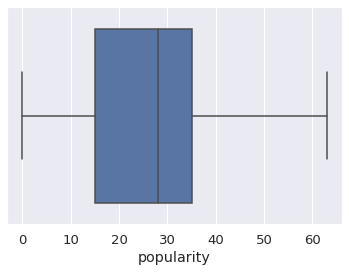

In [ ]:
#variacao dos dados na variavel popularity
sns.boxplot(x='popularity', data=df_artist)

#Correlacionando os Dados

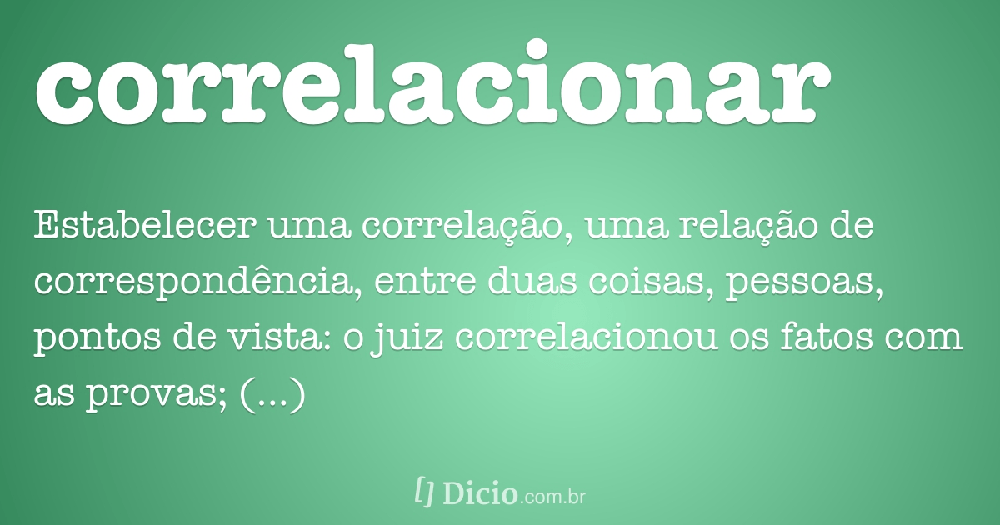

### Álbuns comparados por energia e volume

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
 <a list of 12 Text major ticklabel objects>)

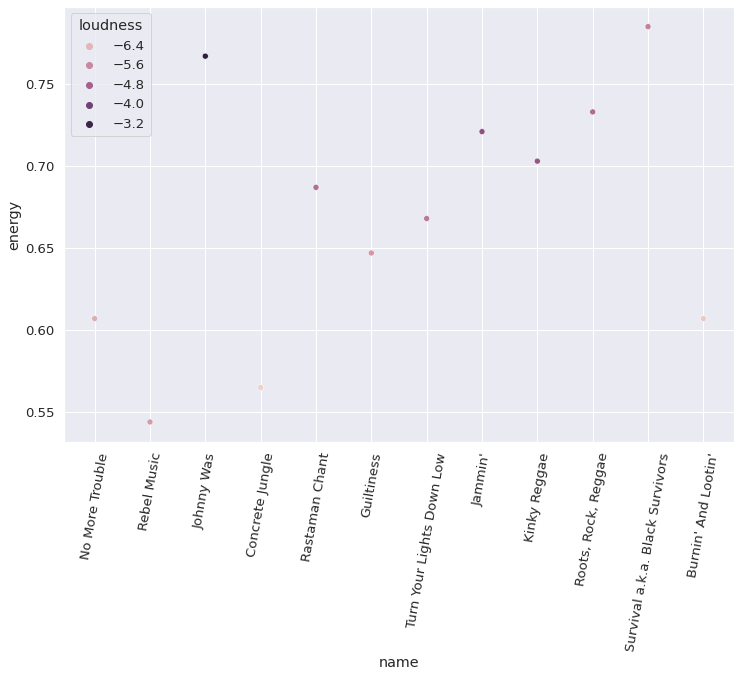

In [ ]:
#Correlacionando variaveis
album_principal = 'Chant Down Babylon'
plt.figure(figsize=(12,8))
sns.scatterplot(data = df_artist.query('album in @album_principal'), y= 'energy', x='name', hue='loudness')
plt.xticks(rotation=80)

### Álbuns comparados por dançabilidade e volume

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
 <a list of 12 Text major ticklabel objects>)

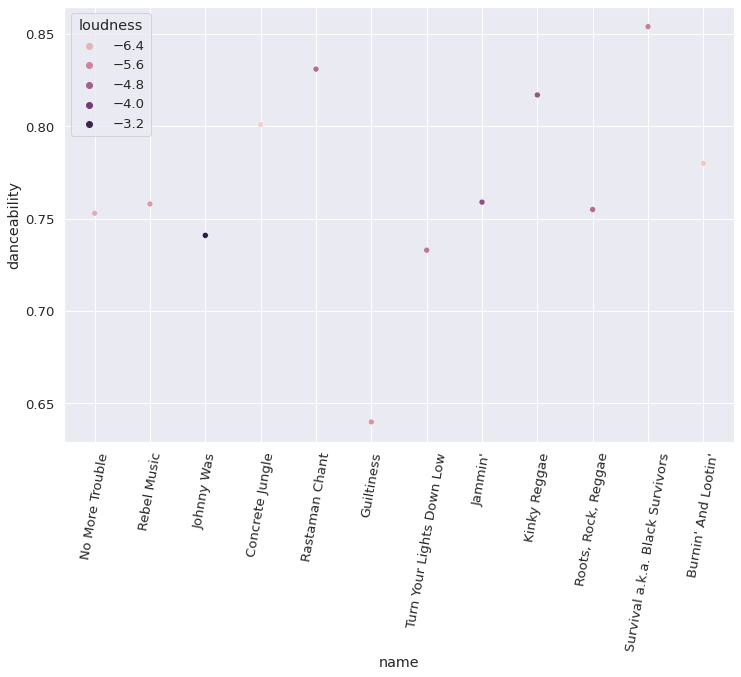

In [ ]:
album_principal = 'Chant Down Babylon'
plt.figure(figsize=(12,8))
sns.scatterplot(data = df_artist.query('album in @album_principal'), y= 'danceability', x='name', hue='loudness')
plt.xticks(rotation=80)

### Álbuns comparados por acústica

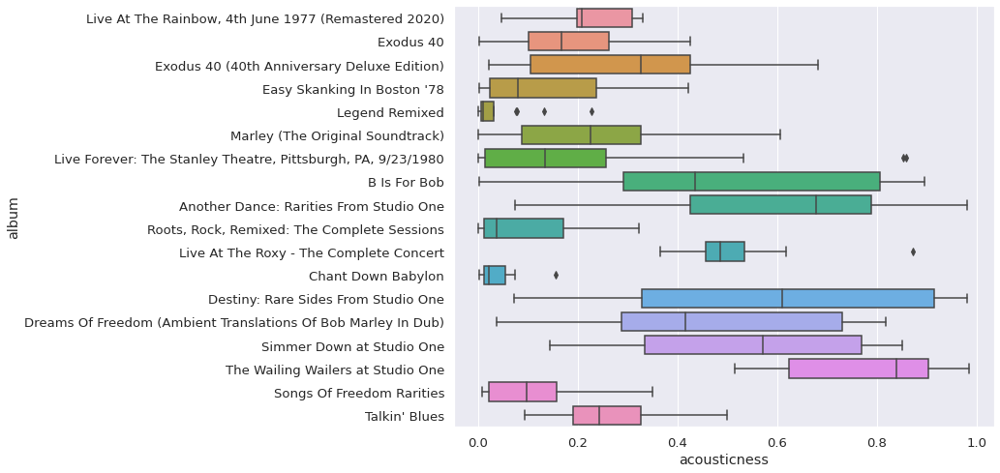

In [ ]:
#Analisando as caracteristicas dos albuns baseado na variavel acousticness
plt.figure(figsize=(10,8))
sns.boxplot(y='album', x='acousticness' , data=df_artist)
#plt.xticks(rotation=45)

### Álbuns comparados por Dançabilidade

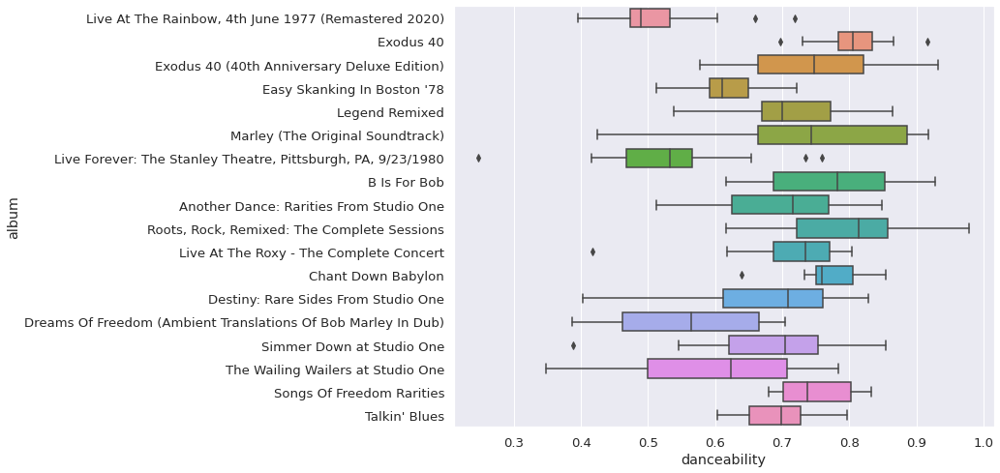

In [ ]:
#Analisando as caracteristicas dos albuns baseado na variavel danceability
plt.figure(figsize=(10,8))
sns.boxplot(y='album', x='danceability' , data=df_artist)

### Álbuns comparados por Energia

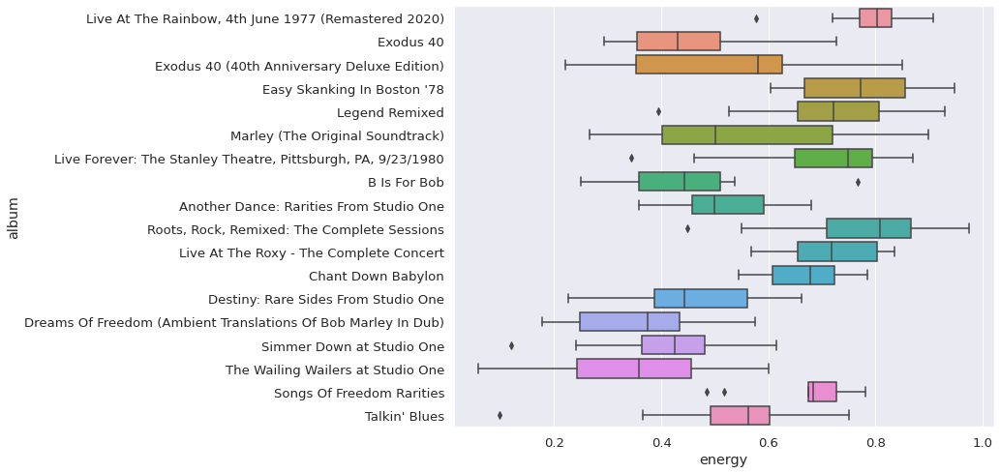

In [ ]:
#Analisando as caracteristicas dos albuns baseado na variavel energy
plt.figure(figsize=(10,8))
sns.boxplot(y='album', x='energy' , data=df_artist)
#plt.xticks(rotation=45)

### Álbuns comparados por Instrumentalidade

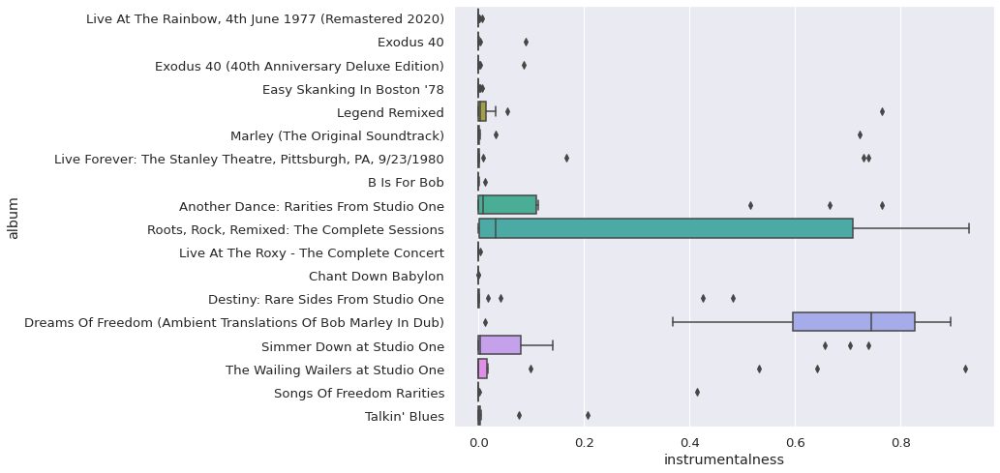

In [ ]:
#Analisando as caracteristicas dos albuns baseado na variavel instrumentalness
plt.figure(figsize=(10,8))
sns.boxplot(y='album', x='instrumentalness' , data=df_artist)

### Álbuns comparados por Vivacidade

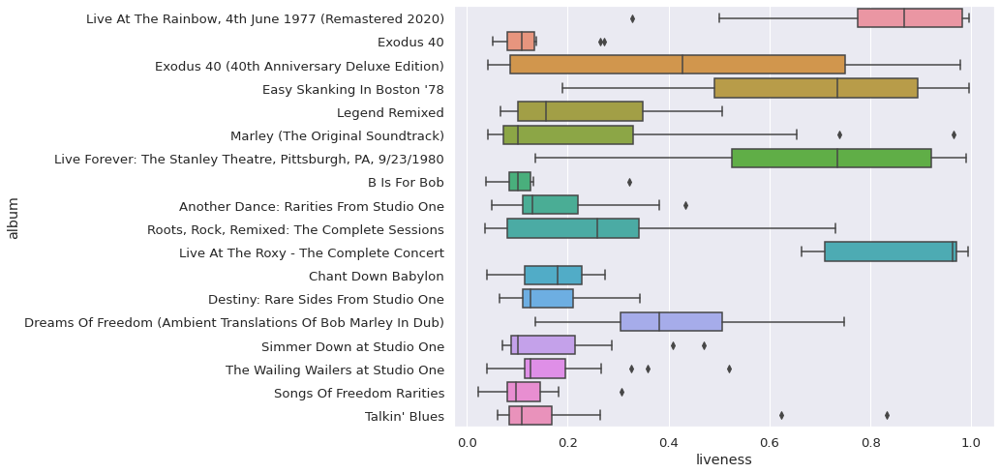

In [ ]:
#Analisando as caracteristicas dos albuns baseado na variavel liveness
plt.figure(figsize=(10,8))
sns.boxplot(y='album', x='liveness' , data=df_artist)

### Álbuns comparados por Volume

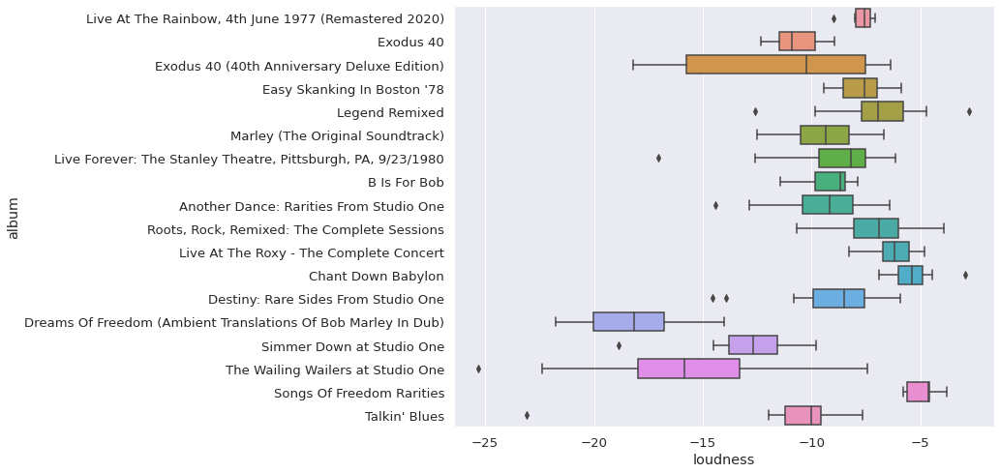

In [ ]:
#Analisando as caracteristicas dos albuns baseado na variavel loudness
plt.figure(figsize=(10,8))
sns.boxplot(y='album', x='loudness' , data=df_artist)

### Álbuns comparados por Tempo

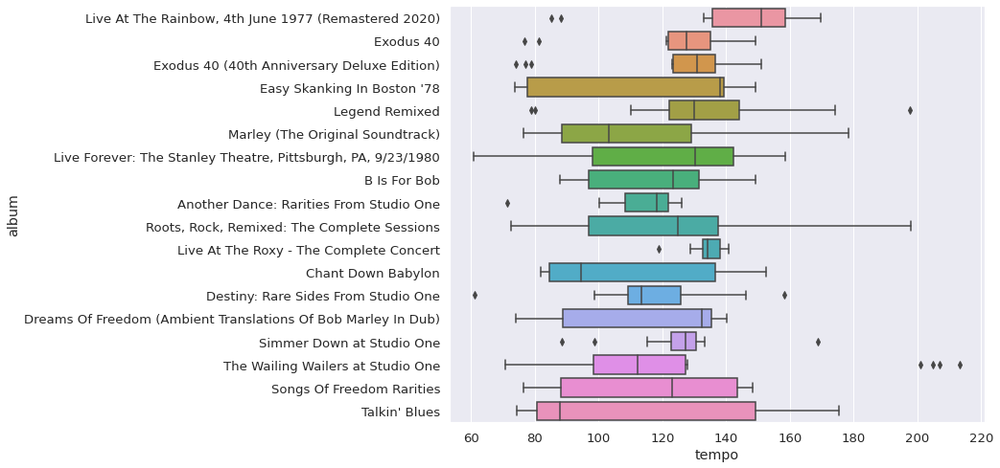

In [ ]:
#Analisando as caracteristicas dos albuns baseado na variavel tempo
plt.figure(figsize=(10,8))
sns.boxplot(y='album', x='tempo' , data=df_artist)

### Álbuns comparados por Positividade

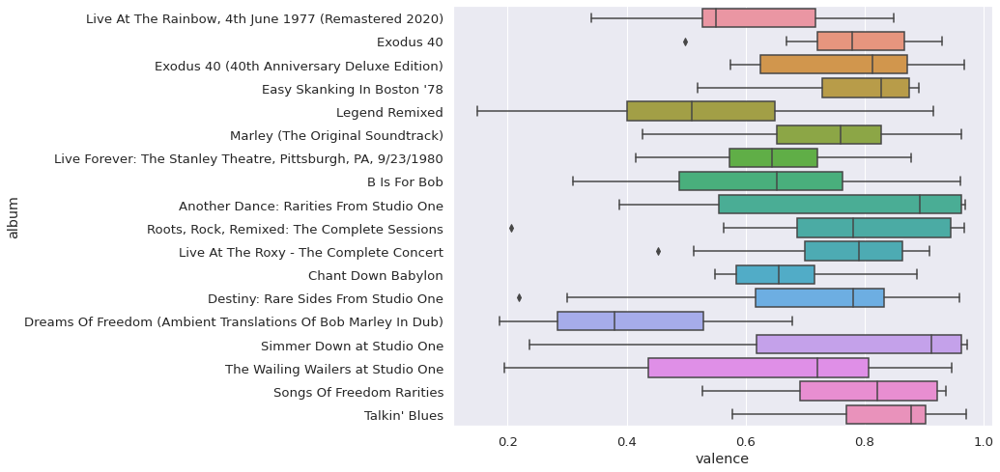

In [ ]:
#Analisando as caracteristicas dos albuns baseado na variavel valence
plt.figure(figsize=(10,8))
sns.boxplot(y='album', x='valence' , data=df_artist)

### Álbuns comparados por Popularidade

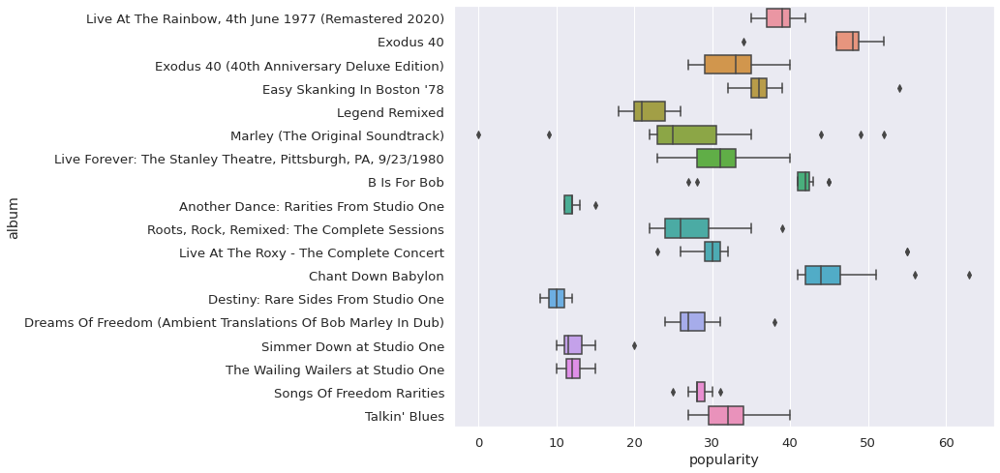

In [ ]:
#Analisando as caracteristicas dos albuns baseado na variavel popularity
plt.figure(figsize=(10,8))
sns.boxplot(y='album', x='popularity' , data=df_artist)

## Cruzando Dados de Músicas com Álbums

In [ ]:
#cruzando os dados - Que musicas fazem parte de que albuns
pd.crosstab(df_artist['album'], df_artist['name'])

name,400 Years - Jimpster Remix,African Herbsman - King Kooba Remix,All In One - Cordovan Remix,Am-A-Do,Amen,And I Love Her (Alternate Take),Another Dance,Bend Down Low,Bend Down Low - Alternate Version,Bend Down Low - B Is Version,Bend Down Low - Live,Buffalo Soldier - Stephen Marley Remix,"Burnin' & Lootin' - Live At Music Hall, Boston / 1978","Burnin' & Lootin' - Live At The Record Plant, 1973","Burnin' & Lootin' - Live At The Stanley Theatre, 9/23/1980",Burnin' And Lootin',Burnin' And Lootin' - 1976/Live At The Roxy,Burnin' And Lootin' - Bill Laswell Remix,"Burnin' And Lootin' - Live At Rainbow Theatre, London / 1977","Burnin' And Lootin' - Live At The Rainbow Theatre, London / 1977",Can't You See,"Coming In From The Cold - 12"" Mix","Coming In From The Cold - Live At The Stanley Theatre, 9/23/1980",Concrete Jungle,Corner Stone,Corner Stone - Patchworks Remix,Could You Be Loved,Could You Be Loved - Edit,"Could You Be Loved - Live At The Stanley Theatre, 9/23/1980",Could You Be Loved - RAC Remix,Crazy Baldhead - Groucho Mix,"Crazy Baldhead - Live At The Stanley Theatre, 9/23/1980","Crazy Baldhead / Running Away - Live At The Rainbow Theatre, London / 1977",Cry To Me,Cry to Me,Dance With Me,Destiny,Diamond Baby,Do It Right,Do You Feel The Same Way,...,Three Little Birds - Exodus 40 Mix,Three Little Birds - Stephen Marley and Jason Bentley Remix,Treat Me Good,"Trenchtown Rock - Live At The Rainbow Theatre, London / 1977",Trenchtown Rock - Live At The Roxy Theatre,Trenchtown Rock - Trio Electrico Remix,True Confession,Turn Your Lights Down Low,Turn Your Lights Down Low - Exodus 40 Mix,Wages Of Love,Wages of Love,Wages of Love (Rehearsal),Waiting In Vain,Waiting In Vain - Advert Mix,Waiting In Vain - Bill Laswell Remix,Waiting In Vain - Exodus 40 Mix,Waiting In Vain - Jim James Remix,Wake Up And Live - Pt. 1,"Walk The Proud Land - Live At The Record Plant, 1973",Want More - Live At The Roxy,War - Live At The Rainbow,"War / No More Trouble - Live At Music Hall, Boston / 1978","War / No More Trouble - Live At The Rainbow Theatre, London / 1977","War / No More Trouble - Live At The Stanley Theatre, 9/23/1980",What Am I Suppose to Do,What's New Pussycat,When the Well Runs Dry,Where Is My Mother (Acoustic),Where Is My Mother (Band Take),Where Will I Find,Where's the Girl for Me,White Christmas,Who Feels It Knows It,Why Should I,Work,"Work - Live At The Stanley Theatre, 9/23/1980","You Can't Blame The Youth - Live At The Record Plant, 1973",Your Love,"Zimbabwe - Live At The Stanley Theatre, 9/23/1980","Zion Train - Live At The Stanley Theatre, 9/23/1980"
album,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Another Dance: Rarities From Studio One,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
B Is For Bob,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Chant Down Babylon,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Destiny: Rare Sides From Studio One,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,1,...,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,1,0,0,0,0,0,1,0,0
Dreams Of Freedom (Ambient Translations Of Bob Marley In Dub),0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Easy Skanking In Boston '78,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Exodus 40,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0

##Verificando tendências entre os atributos

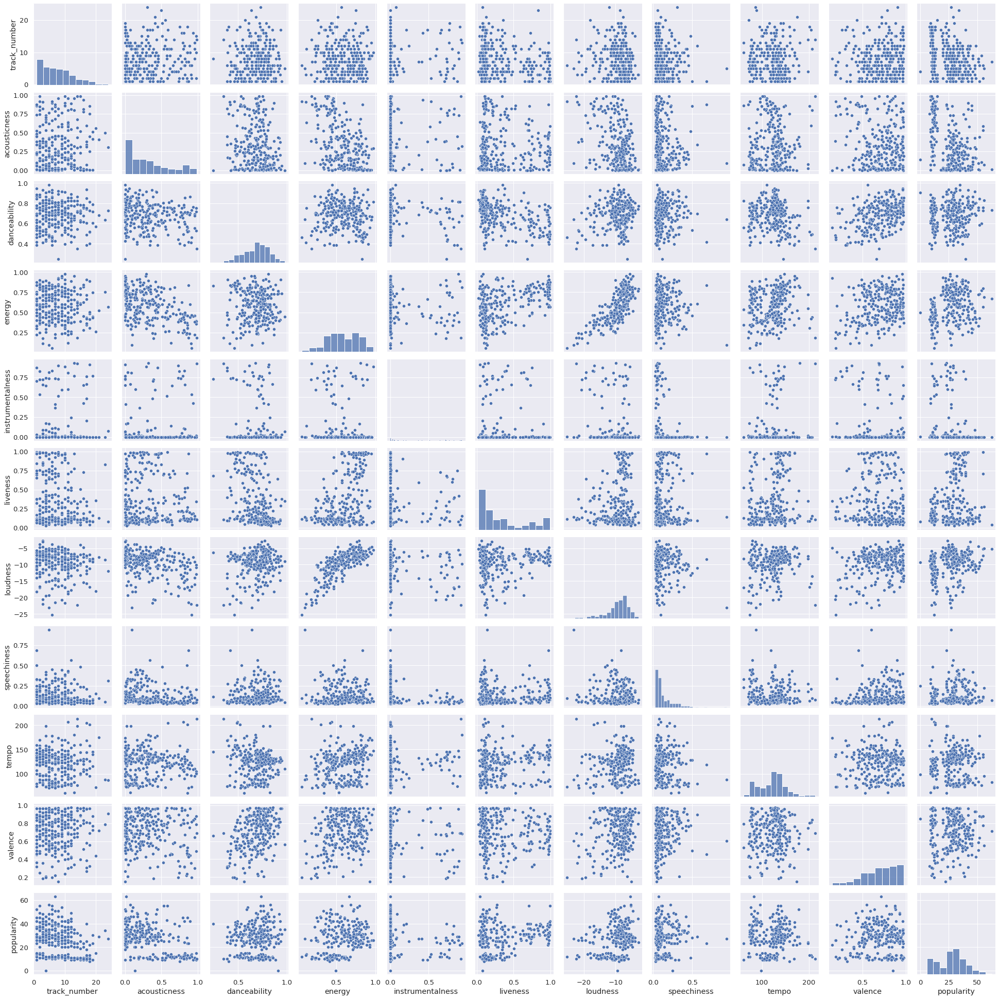

In [ ]:
#verificando se existem tendencias de correlacionamento entre as variaveis
sns.pairplot(df_artist)


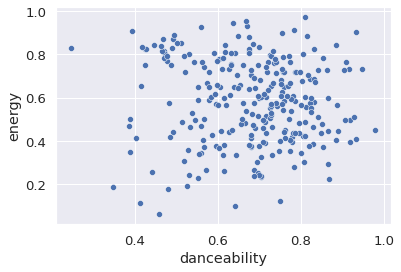

In [ ]:
#verificando o correlacionamento dos dados (danceability X energy)
sns.scatterplot(x='danceability', y = 'energy', data=df_artist)

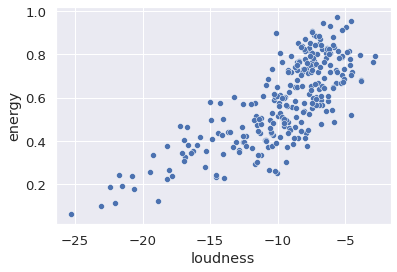

In [ ]:
#verificando o correlacionamento dos dados (loudness X energy)
sns.scatterplot(x='loudness', y = 'energy', data=df_artist)

##Traçando a Regressão Linear

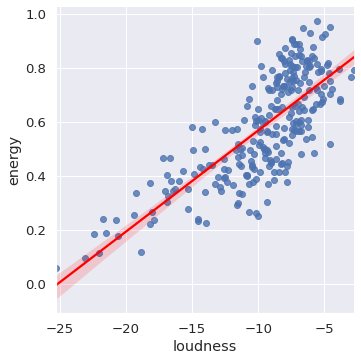

In [ ]:
#gera um grafico com a linha de regressao linear
sns.lmplot(data=df_artist, x='loudness', y='energy', line_kws={'color': 'red'})

## Plotando o Heatmap de Correlação

In [ ]:
#gera as correlacoes entre as variaveis
corr = df_artist.corr()
corr

,track_number,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
track_number,1.000000,0.069542,-0.000524,-0.049012,0.080343,-0.225834,-0.075493,-0.103518,0.002130,0.064064,-0.300144
acousticness,0.069542,1.000000,-0.181108,-0.484696,0.080446,-0.074022,-0.419601,-0.124900,0.031511,-0.093422,-0.423494
danceability,-0.000524,-0.181108,1.000000,-0.057445,-0.133728,-0.409864,0.163915,0.010618,-0.188965,0.405062,0.053951
energy,-0.049012,-0.484696,-0.057445,1.000000,-0.083168,0.461795,0.764383,-0.026218,0.181185,0.239747,0.266662
instrumentalness,0.080343,0.080446,-0.133728,-0.083168,1.000000,-0.049678,-0.259589,-0.197001,0.086551,-0.212768,-0.159643
liveness,-0.225834,-0.074022,-0.409864,0.461795,-0.049678,1.000000,0.220045,0.011686,0.170870,-0.084702,0.249639
loudness,-0.075493,-0.419601,0.163915,0.764383,-0.259589,0.220045,1.000000,-0.094192,0.109935,0.228218,0.268356
speechiness,-0.103518,-0.124900,0.010618,-0.026218,-0.197001,0.011686,-0.094192,1.000000,-0.106087,0.098810,0.147978
tempo,0.002130,0.031511,-0.188965,0.181185,0.086551,0.170870,0.109935,-0.106087,1.000000,0.013186,-0.024728
valence,0.064064,-0.093422,0.405062,0.239747,-0.212768,-0.084702,0.228218,0.098810,0.013186,1.000000,-0.016685


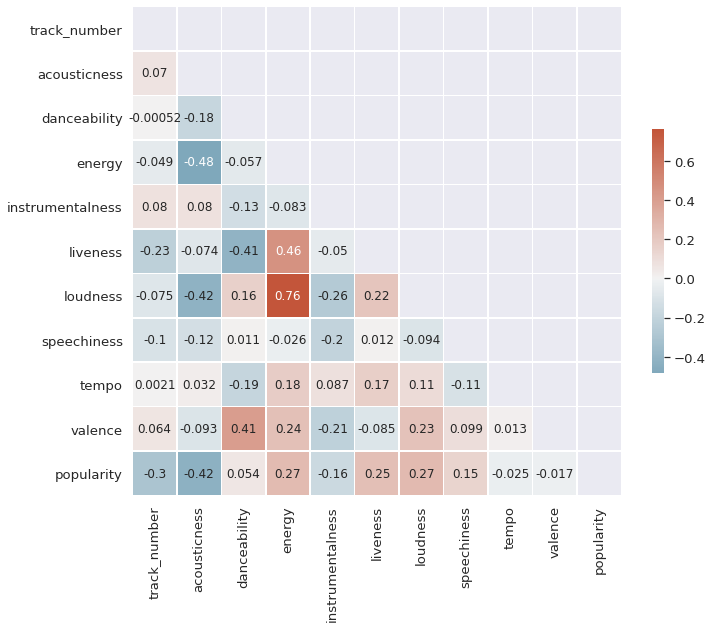

In [ ]:
# Gera a mascara do triangulo de cima
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up matplotlib
f, ax = plt.subplots(figsize=(11, 9))

# gera o colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# desenha o heatmap com a mascara 
sns.heatmap(corr, mask=mask, cmap=cmap, center=0, annot=True,
            annot_kws={"size": 12}, square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Comparando as músicas mais populares com as outras músicas do artista

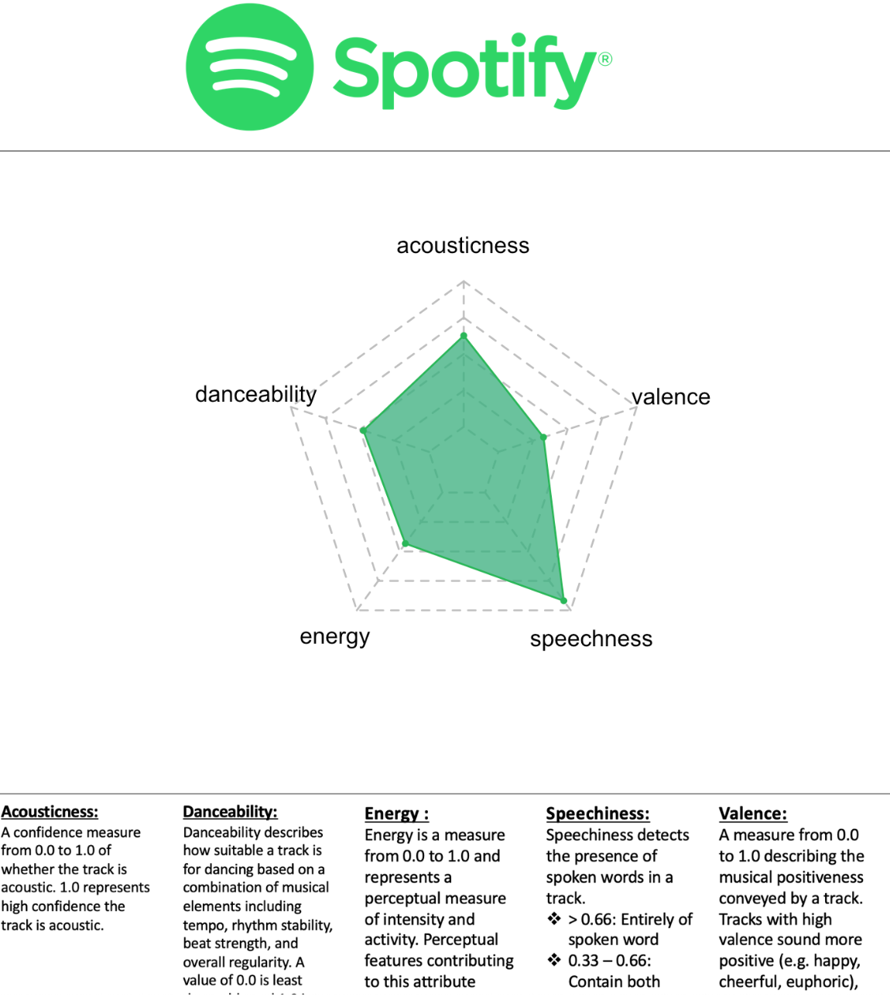

In [ ]:
df_artist.columns


Index(['album', 'track_number', 'id', 'name', 'uri', 'acousticness',
       'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness',
       'speechiness', 'tempo', 'valence', 'popularity', 'artist'],
      dtype='object')

In [ ]:
features = df_artist.drop(['album','track_number', 'id', 'name','uri','artist'], axis=1)

In [ ]:
features.head()

,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,0.208,0.492,0.873,0.000002,0.996,-7.962,0.2030,158.604,0.716,42
1,0.299,0.470,0.814,0.000869,0.984,-7.571,0.1820,169.621,0.765,41
2,0.309,0.532,0.803,0.000032,0.858,-7.213,0.2460,142.346,0.733,40
3,0.317,0.495,0.890,0.000010,0.968,-7.326,0.3280,158.357,0.629,40
4,0.207,0.489,0.829,0.006800,0.730,-7.656,0.0805,150.943,0.503,40


In [ ]:
#separa os dados em dois dataframes apenas com as colunas numericas que queremos analisar
df_mais_populares = df_artist[['danceability', 'energy', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'popularity' ]].nlargest(50,'popularity')
df_resto_musicas = df_artist[['danceability', 'energy', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'popularity' ]]
#concatena os dois dataframes removendo as duplicatas
df_resto_musicas = pd.concat([df_resto_musicas, df_mais_populares, df_mais_populares]).drop_duplicates(keep=False)


In [ ]:
df_mais_populares

,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,popularity
176,0.733,0.668,0.0685,0.01370,0.000002,0.0393,0.713,63
174,0.831,0.687,0.2190,0.07300,0.000005,0.2730,0.549,56
158,0.755,0.570,0.0995,0.58600,0.000000,0.9930,0.877,55
162,0.727,0.795,0.1150,0.53300,0.000105,0.7100,0.772,55
46,0.598,0.772,0.0646,0.10800,0.000028,0.2690,0.875,54
13,0.842,0.727,0.0487,0.00222,0.000844,0.0835,0.879,52
72,0.586,0.426,0.0689,0.44300,0.000000,0.1700,0.638,52
19,0.730,0.334,0.0633,0.09560,0.000031,0.1230,0.498,51
177,0.759,0.721,0.1110,0.00802,0.000000,0.1320,0.587,51
14,0.805,0.422,0.2600,0.16400,0.000000,0.1380,0.930,49


In [ ]:
df_resto_musicas

,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,popularity
8,0.484,0.5770,0.0368,0.198000,0.000091,0.8550,0.528,38
9,0.395,0.9080,0.2700,0.166000,0.002460,0.9820,0.487,37
10,0.603,0.7810,0.0784,0.325000,0.000336,0.5010,0.548,37
11,0.479,0.7700,0.0969,0.206000,0.000000,0.3270,0.550,36
12,0.467,0.8150,0.1040,0.046400,0.000004,0.7740,0.341,35
22,0.807,0.3010,0.3730,0.293000,0.000000,0.2640,0.746,34
23,0.868,0.2210,0.3260,0.101000,0.000060,0.0672,0.860,37
24,0.748,0.3530,0.0889,0.326000,0.000000,0.3800,0.651,33
25,0.832,0.5810,0.0479,0.041600,0.000539,0.4280,0.968,35
26,0.932,0.4060,0.3110,0.372000,0.000090,0.1070,0.814,35


In [ ]:
df_artist.popularity.describe()

count    269.000000
mean      27.330855
std       11.981259
min        0.000000
25%       15.000000
50%       28.000000
75%       35.000000
max       63.000000
Name: popularity, dtype: float64

In [ ]:
#retorna os valores em um numpy array, aplica escala e depois retorna pro dataframex = df_resto_musicas.values 
x = df_resto_musicas.values
min_max_scaler = preprocessing.MinMaxScaler()
#normaliza os dados aplicando o scaler
x_scaled = min_max_scaler.fit_transform(x)
#retorna os dados normalizados para o dataframe
df_resto_musicas = pd.DataFrame(x_scaled)
#renomeia as colunas
df_resto_musicas.columns = ['danceability', 'energy', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'popularity' ]

df_resto_musicas

,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,popularity
0,0.215531,0.565739,0.011600,0.201001,0.000098,0.861327,0.459951,1.000000
1,0.074485,0.926896,0.266798,0.168513,0.002645,0.992756,0.410194,0.973684
2,0.404120,0.788325,0.057124,0.329937,0.000361,0.494981,0.484223,0.973684
3,0.207607,0.776323,0.077369,0.209123,0.000000,0.314913,0.486650,0.947368
4,0.188590,0.825423,0.085139,0.047089,0.000004,0.777502,0.233010,0.921053
5,0.727417,0.264594,0.379514,0.297449,0.000000,0.249715,0.724515,0.894737
6,0.824089,0.177305,0.328081,0.102522,0.000064,0.046052,0.862864,0.973684
7,0.633914,0.321331,0.068615,0.330952,0.000000,0.369761,0.609223,0.868421
8,0.767036,0.570104,0.023747,0.042216,0.000580,0.419435,0.993932,0.921053
9,0.925515,0.379160,0.311666,0.377654,0.000097,0.087240,0.807039,0.921053


In [ ]:
#retorna os valores em um numpy array, aplica escala e depois retorna pro dataframe
x = df_mais_populares.values
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df_mais_populares = pd.DataFrame(x_scaled)

df_mais_populares.columns = ['danceability', 'energy', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'popularity' ]

df_mais_populares

,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,popularity
0,0.713656,0.653125,0.103088,0.015296,0.000002,0.001357,0.671523,1.00
1,0.857562,0.682813,0.487114,0.081554,0.000006,0.245303,0.454305,0.72
2,0.745962,0.500000,0.182189,0.654745,0.000000,0.996868,0.888742,0.68
3,0.704846,0.851562,0.221740,0.595526,0.000144,0.701461,0.749669,0.68
4,0.515419,0.815625,0.093136,0.120660,0.000039,0.241127,0.886093,0.64
5,0.873715,0.745313,0.052564,0.002469,0.001156,0.047495,0.891391,0.56
6,0.497797,0.275000,0.104108,0.494966,0.000000,0.137787,0.572185,0.56
7,0.709251,0.131250,0.089819,0.106805,0.000042,0.088727,0.386755,0.52
8,0.751836,0.735937,0.211534,0.008950,0.000000,0.098121,0.504636,0.52
9,0.819383,0.268750,0.591733,0.183231,0.000000,0.104384,0.958940,0.44


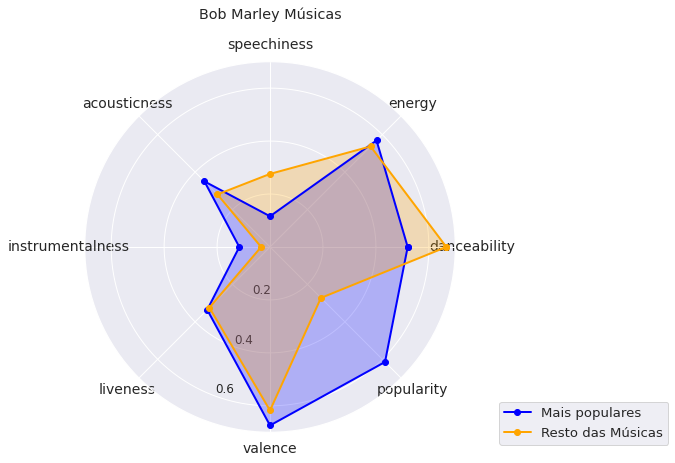

In [ ]:
#monta o radar plot comparando as 50 musicas mais populares do artista com o resto das musicas
labels = list(df_resto_musicas)[:]
stats = df_resto_musicas.mean().tolist()
stats2 = df_mais_populares.mean().tolist()

angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
fig = plt.figure(figsize = (15,15))

# Fecha o plot
stats=np.concatenate((stats,[stats[0]]))
stats2=np.concatenate((stats2,[stats2[0]]))
angles=np.concatenate((angles,[angles[0]]))

ax = fig.add_subplot(221, polar=True)
ax.plot(angles, stats, 'o-', linewidth=2, label = "Mais populares", color= 'blue')
ax.fill(angles, stats, alpha=0.25, facecolor='blue')
ax.set_thetagrids(angles * 180/np.pi, labels , fontsize = 14)

ax.set_rlabel_position(250)
plt.yticks([0.2, 0.4, 0.6, 0.8, 1.0], ["0.2","0.4", "0.6", "0.8", "1.0"], size=12)
plt.ylim(0,0.7)

ax.plot(angles, stats2, 'o-', linewidth=2, label = "Resto das Músicas", color= 'orange')
ax.fill(angles, stats2, alpha=0.25, facecolor='orange')
ax.set_title('Bob Marley Músicas', y=1.10)
ax.grid(True)

plt.legend(loc='best', bbox_to_anchor=(1.1, 0.1))




# Perguntas sobre os Dados

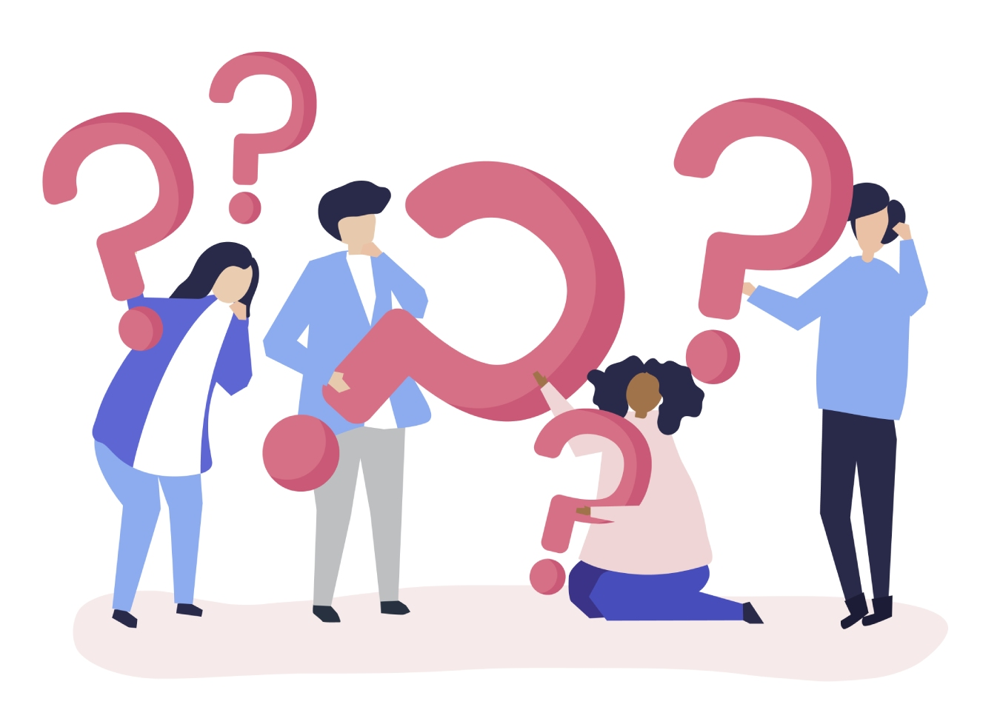

In [ ]:
#Pergunta 1: Qual o disco mais dancante do artista?

df_top = df_artist.nlargest(50,'danceability')

df_top.album.value_counts()

#Resposta: O album 'Roots, Rock, Remixed: The Complete Sessions' é o disco que possui mais musicas dancantes


Roots, Rock, Remixed: The Complete Sessions    11
Marley (The Original Soundtrack)                6
Exodus 40                                       6
B Is For Bob                                    5
Exodus 40 (40th Anniversary Deluxe Edition)     5
Chant Down Babylon                              4
Songs Of Freedom Rarities                       3
Simmer Down at Studio One                       3
Destiny: Rare Sides From Studio One             3
Another Dance: Rarities From Studio One         2
Live At The Roxy - The Complete Concert         1
Legend Remixed                                  1
Name: album, dtype: int64

In [ ]:
#Pergunta 2: Qual o disco mais acustico do artista?

df_top = df_artist.nlargest(50,'acousticness')

df_top.album.value_counts()

#Resposta: O album 'The Wailing Wailers at Studio One' é o disco que possui mais musicas acusticas

The Wailing Wailers at Studio One                                13
Another Dance: Rarities From Studio One                           9
Destiny: Rare Sides From Studio One                               9
Simmer Down at Studio One                                         6
Dreams Of Freedom (Ambient Translations Of Bob Marley In Dub)     4
B Is For Bob                                                      4
Live Forever: The Stanley Theatre, Pittsburgh, PA, 9/23/1980      2
Exodus 40 (40th Anniversary Deluxe Edition)                       2
Live At The Roxy - The Complete Concert                           1
Name: album, dtype: int64

In [ ]:
#Pergunta 3: Qual o disco mais instrumental do artista?

df_top = df_artist.nlargest(50,'instrumentalness')

df_top.album.value_counts()

#Resposta: O album 'Dreams Of Freedom (Ambient Translations Of Bob Marley In Dub)' é o disco que possui mais musicas instrumentais

Dreams Of Freedom (Ambient Translations Of Bob Marley In Dub)    10
Roots, Rock, Remixed: The Complete Sessions                       9
Simmer Down at Studio One                                         6
Another Dance: Rarities From Studio One                           5
The Wailing Wailers at Studio One                                 4
Legend Remixed                                                    3
Live Forever: The Stanley Theatre, Pittsburgh, PA, 9/23/1980      3
Destiny: Rare Sides From Studio One                               3
Talkin' Blues                                                     2
Marley (The Original Soundtrack)                                  2
Exodus 40                                                         1
Songs Of Freedom Rarities                                         1
Exodus 40 (40th Anniversary Deluxe Edition)                       1
Name: album, dtype: int64

In [ ]:
#Pergunta 4: Qual o disco mais ao vivo do artista?

df_top = df_artist.nlargest(50,'liveness')

df_top.album.value_counts()

#Resposta: O album 'Live Forever: The Stanley Theatre, Pittsburgh, PA, 9/23/1980' é o disco que possui mais musicas ao vivo

Live Forever: The Stanley Theatre, Pittsburgh, PA, 9/23/1980     13
Live At The Rainbow, 4th June 1977 (Remastered 2020)             11
Live At The Roxy - The Complete Concert                           9
Easy Skanking In Boston '78                                       7
Exodus 40 (40th Anniversary Deluxe Edition)                       5
Marley (The Original Soundtrack)                                  2
Dreams Of Freedom (Ambient Translations Of Bob Marley In Dub)     1
Talkin' Blues                                                     1
Roots, Rock, Remixed: The Complete Sessions                       1
Name: album, dtype: int64

In [ ]:
#Pergunta 5: Qual o disco mais positivo do artista?

df_top = df_artist.nlargest(50,'valence')

df_top.album.value_counts()

#Resposta: O album 'Roots, Rock, Remixed: The Complete Sessions' é o disco que possui mais musicas positivas

Another Dance: Rarities From Studio One        8
Roots, Rock, Remixed: The Complete Sessions    8
Simmer Down at Studio One                      8
Talkin' Blues                                  6
Marley (The Original Soundtrack)               3
Songs Of Freedom Rarities                      3
Exodus 40 (40th Anniversary Deluxe Edition)    3
Exodus 40                                      2
The Wailing Wailers at Studio One              2
Destiny: Rare Sides From Studio One            2
B Is For Bob                                   1
Legend Remixed                                 1
Chant Down Babylon                             1
Live At The Roxy - The Complete Concert        1
Easy Skanking In Boston '78                    1
Name: album, dtype: int64

In [ ]:
#Pergunta 6: Qual o disco mais popular do artista?

df_top = df_artist.nlargest(50,'popularity')

df_top.album.value_counts()

#Resposta: O album 'Chant Down Babylon' é o disco que possui mais musicas populares

Chant Down Babylon                                              12
B Is For Bob                                                     9
Exodus 40                                                        9
Live At The Rainbow, 4th June 1977 (Remastered 2020)             8
Marley (The Original Soundtrack)                                 3
Easy Skanking In Boston '78                                      3
Live At The Roxy - The Complete Concert                          2
Live Forever: The Stanley Theatre, Pittsburgh, PA, 9/23/1980     1
Talkin' Blues                                                    1
Roots, Rock, Remixed: The Complete Sessions                      1
Exodus 40 (40th Anniversary Deluxe Edition)                      1
Name: album, dtype: int64

In [ ]:
#Pergunta 7: Quais são as músicas mais populares do artista?

df_top = df_artist.nlargest(10,'popularity')

df_top.name

#Resposta: Essas são as 10 musicas mais populares do artista no Spotify:

176                            Turn Your Lights Down Low
174                                       Rastaman Chant
158           Trenchtown Rock - Live At The Roxy Theatre
162                I Shot The Sheriff - Live At The Roxy
46     Lively Up Yourself - Live At Music Hall, Bosto...
13                                Exodus - Exodus 40 Mix
72                                            Stir It Up
19             Turn Your Lights Down Low - Exodus 40 Mix
177                                              Jammin'
14                        Natural Mystic - Exodus 40 Mix
Name: name, dtype: object

In [ ]:
#Pergunta 8: O que aumenta a chance de uma musica desse artista ser popular ?
df_top = df_artist.nlargest(50,'popularity')

print('Pertencer a um desses Albuns:\n', df_top.album.value_counts().head(5))

print('\nTer acousticness em torno de:\n', df_artist.nlargest(50,'popularity')['acousticness'].mean())

print('\nTer danceability em torno de:\n', df_artist.nlargest(50,'popularity')['danceability'].mean())

print('\nTer energy em torno de:\n', df_artist.nlargest(50,'popularity')['energy'].mean())

print('\nTer instrumentalness em torno de:\n', df_artist.nlargest(50,'popularity')['instrumentalness'].mean())

print('\nTer liveness em torno de:\n', df_artist.nlargest(50,'popularity')['liveness'].mean())

print('\nTer loudness em torno de:\n', df_artist.nlargest(50,'popularity')['loudness'].mean())

print('\nTer speechiness em torno de:\n', df_artist.nlargest(50,'popularity')['speechiness'].mean())

print('\nTer tempo em torno de:\n', df_artist.nlargest(50,'popularity')['tempo'].mean())

print('\nTer valence em torno de:\n', df_artist.nlargest(50,'popularity')['valence'].mean())

#Resposta: Essas são as features mais comuns nas musicas mais populares do artista no Spotify:

Pertencer a um desses Albuns:
 Chant Down Babylon                                      12
B Is For Bob                                             9
Exodus 40                                                9
Live At The Rainbow, 4th June 1977 (Remastered 2020)     8
Marley (The Original Soundtrack)                         3
Name: album, dtype: int64

Ter acousticness em torno de:
 0.25129200399999996

Ter danceability em torno de:
 0.70058

Ter energy em torno de:
 0.5938399999999999

Ter instrumentalness em torno de:
 0.024553225599999996

Ter liveness em torno de:
 0.34834200000000004

Ter loudness em torno de:
 -8.06384

Ter speechiness em torno de:
 0.13625199999999998

Ter tempo em torno de:
 116.71229999999997

Ter valence em torno de:
 0.6722400000000002


# Relatorio de Profile dos Dados

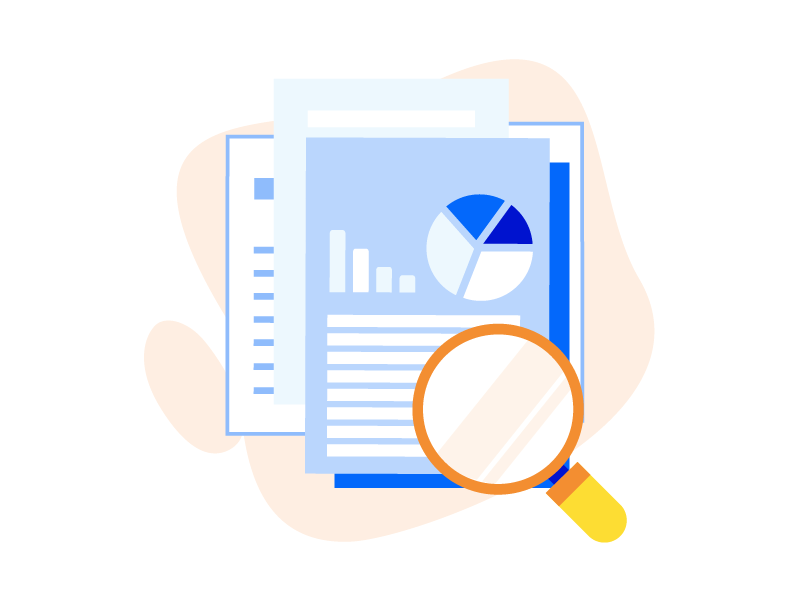

Importando as Bibliotecas de Profiling

##Usando o DataProfiler

In [ ]:
#calcula as estatisticas dos campos e exporta um Json com os dados
profile = Profiler(df_artist) 

readable_report = profile.report(report_options={"output_format": "compact"})

print(json.dumps(readable_report, indent=4))

100%|██████████| 16/16 [00:00<00:00, 431.02it/s]

Finding the Null values in the columns...



  0%|          | 0/16 [00:00<?, ?it/s]

Calculating the statistics...  (with 4 processes)


100%|██████████| 16/16 [00:03<00:00,  5.10it/s]


{
    "global_stats": {
        "samples_used": 269,
        "column_count": 16,
        "row_count": 269,
        "row_has_null_ratio": 0.0,
        "row_is_null_ratio": 0.0,
        "unique_row_ratio": 1.0,
        "duplicate_row_count": 0,
        "file_type": "<class 'pandas.core.frame.DataFrame'>",
        "encoding": null
    },
    "data_stats": {
        "album": {
            "column_name": "album",
            "data_type": "string",
            "data_label": "UNKNOWN",
            "categorical": true,
            "order": "random",
            "samples": "['Live At The Rainbow, 4th June 1977 (Remastered 2020)',\n 'Dreams Of Freedom (Ambient Translations Of Bob Marley In Dub)',\n 'Exodus 40 (40th Anniversary Deluxe Edition)',\n 'Marley (The Original Soundtrack)', 'Simmer Down at Studio One']",
            "statistics": {
                "min": 9.0,
                "max": 61.0,
                "mean": 33.7546,
                "variance": 236.5814,
                "stddev": 15.3

## Usando o SweetViz

In [ ]:
my_report = sv.analyze(df_artist,"popularity")
my_report.show_html()

                                             |          | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


#Concluindo a Análise dos Dados

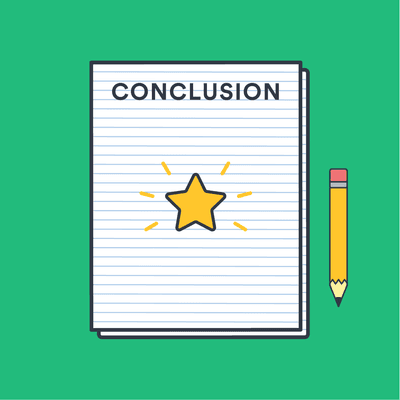

**Observações**

*   *O coeficiente de correlação varia de `-1` a `1`. 
Se valor é próximo de 1, isto significa que existe uma forte correlação positiva entre as variáveis(Quando uma aumenta, a outra aumenta também). Quando esse número é próximo de -1, as variáveis tem uma forte correlação negativa(Quando uma aumenta, a outra diminui).*

*   *O relatório que executamos acima nos mostra que a nossa variável alvo (**POPULARIDADE**) é fortemente correlacionada com positivamente com a variável `Dançabilidade`(0.54) e fortemente correlacionada a variável `Acústica`(-0.42)*

*   *O mesmo acontece com as variaveis `Volume` e `Energia` que apresentaram a maior correlação do conjunto (0.75)*

*   *A `Dançabilidade` da Música parece estar fortemente relacionada a positividade da mesma. (0,41)*

# Utilizando NLP, Inteligência Artificial e Machine Learning


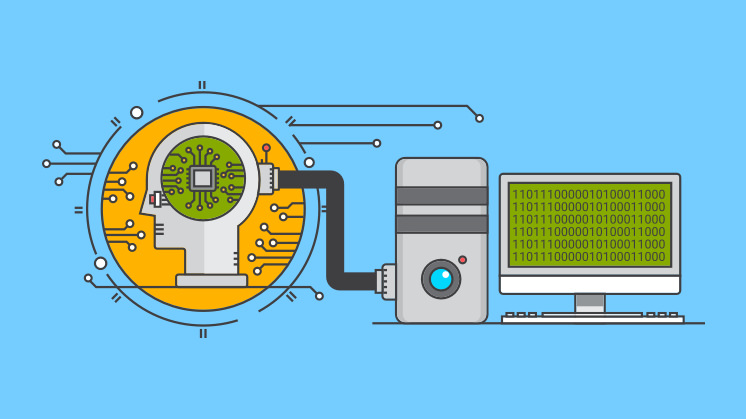

- vamos baixar as letras das musicas do artista e analisar NLP com wordcloud de palavras mais frequentes

## Utilizando o LyricsGenius para baixar as letras

In [ ]:
#testando o LyricsGenius
LyricsGenius = lyricsgenius.Genius('BQDUXNtZlJ6CGFVu8gCXtisA20caG0uDvLK7167I0IgzEJ2uhC7ePxsfCrh3dEOnaoWeR9f9iCifCCMvM6a2WNLDlfbPJaTlLlusmSY3tq0k96pHk-903TZ0h6nC9OiLMUQcmakJRlRvnwF5bd5dR7exw5KBDwD5O6y1L0gmbAIyJR2V42ZUYdeTm9kPY8hCkbwP9rJsml0cF5F-Fq1L0jmypa57CJ75rp3DAlllHtvu6iQJn_c9Oze7kcv2tbFRjgsWiI_6z_qEsfX5YpO8WA')
song = LyricsGenius.search_song("Legend", "Bob Marley")
song.lyrics


Searching for "Legend" by Bob Marley...
Done.


'[Verse 1]\nWe smoke weed we nah sniff charlie\nSo mi haffi big up the legend Bob Marley\nBlackberry phone any time gyal call wi\nSame so we boasy Roberto Cavalli\n\n[Hook]\nCall mi a yardie, Call mi a yardie\nWe love Benz and Beamers and Audi\nCall mi a yardie, Call mi a yardie\nWe love Benz and Beamers and Audi\n\n[Bridge]\nBenz and Beamers and  Audi\nNo gyal nah in a da club we nah party\nGive wi de Hennesy we nah drink no Barcardi\nNo Ben Sherman give me Armarni\n\n[Hook]\nCall mi a yardie, Call mi a yardie\nWe love Benz and Beamers and Audi\n\n[Bridge]\nBenz and Beamers and  Audi\nNo gyal nah in a da club we nah party\nGive wi de Hennesy we nah drink no Barcardi\nNo Ben Sherman give me Armarni\n[Hook]\nCall mi a yardie, Call mi a yardie\nWe love Benz and Beamers and Audi\nCall mi a yardie, Call mi a yardie\nWe love Benz and Beamers and Audi\n\n[Verse 2]\nWe drink champagne when wi ah party\nThe gyaldem bubble up demself an they gwaan naughty\nNo farma Kung fu wi nah deal wit Karat

## Fazendo WebScraping pra buscar as letras

In [ ]:
#Funcao para fazer webscrapping do site genius.com
def scrape_lyrics(artistname, songname):
    #completa os nomes dos atristas com tracos e limpa os caracteres indesejados
    artistname2 = str(artistname.replace(' ','-')) if ' ' in artistname else str(artistname)
    songname2 = str(songname.replace(' ','-')) if ' ' in songname else str(songname)
    songname2 = str(songname2.replace("'",''))
    songname2 = str(songname2.replace(",",''))
    songname2 = str(songname2.replace(".",''))
    songname2 = str(songname2.replace("Survival-aka-",''))
    
    #completa palavras que faltam nos nomes
    if songname2 in ['Rebel-Music', 'Jammin', 'Black-Survivors']:
      songname2 = songname2 + '-remix'

    #define a url de scrapping
    url = 'https://genius.com/'+ artistname2 + '-' + songname2 + '-' + 'lyrics'
    print(url)

    #faz o request pra buscar a pagina
    page = requests.get(url)
    
    #faz o parse do conteudo
    html = BeautifulSoup(page.content, 'html.parser')    
    
    #procura pelas tags que comecam com o valor do DIV container
    lyrics1 = html.find("div", class_="lyrics")
    #lyrics2 = html.find("div", class_="Lyrics__Container-sc-1ynbvzw-7 jjqBBp")
    lyrics2 = html.find("div", class_=re.compile("^Lyrics__Container"))

    if lyrics1:
        lyrics = lyrics1.get_text()
    elif lyrics2:
        lyrics = lyrics2.get_text()
    elif lyrics1 == lyrics2 == None:
        lyrics = None
    print('letra:',lyrics)
    return lyrics



##Armazenando todas as letras de um álbum em um dataframe

In [ ]:
#Cria um dataframe para armazenar as letras de um album popular especifico

ALBUM_NAME = 'Chant Down Babylon'

df_album = df_artist[df_artist['album'] == ALBUM_NAME].copy()

lyrics = []

#para cada musica no album busca a letra fazendo webscrapping do site genius.com e armazena em uma nova coluna
for music in df_album['name']:
  text = scrape_lyrics(ARTIST_NAME, music)
  lyrics.append(text)  
  
df_album['lyrics'] = lyrics

https://genius.com/Bob-Marley-and-The-Wailers-No-More-Trouble-lyrics


NameError: ignored

In [ ]:
df_album

In [ ]:
df_album['lyrics']= df_album['lyrics'].str.lower()

In [ ]:
df_album['lyrics'] = df_album['lyrics'].str.replace(',', '')


In [ ]:
df_album['lyrics'] = df_album['lyrics'].str.strip() # Delete preceding spaces


In [ ]:
df_album['num_palavras'] = [len(x.split()) for x in df_album['lyrics'].tolist()]

In [ ]:
df_album['num_caracteres'] = df_album.lyrics.apply(len)

In [ ]:
df_album

## Descobrindo as palavras mais frequentes nas músicas

In [ ]:
#converte as colunas para string e splita as 200 mais frequentes num dataframe
letras = df_album['lyrics'].to_string()
wd = pd.DataFrame(Counter(letras.split()).most_common(200), columns=['palavra', 'frequencia'])
wd

In [ ]:
#vamos ter que tratar as palvras pra melhorar o resultado
# converte pra lower
words = ''
for i in df_album.lyrics.values:
    words += '{} '.format(i.lower())

#remove os acentos e os numeros
tokenizer = nltk.RegexpTokenizer(r"\w+")
word_tokens = tokenizer.tokenize(re.sub(r'\d+', '', words))

#remove as stopwords
word_list = ['got', 'need', 'want'] + stopwords.words('english')
stop_words = set(word_list)

#gera a lista filtrada
filtered_sentence = [w for w in word_tokens if not w.lower() in stop_words]
 
# cria o dataframe com as palavras e frequencias
wd = pd.DataFrame(Counter(filtered_sentence).most_common(200), columns=['word', 'frequency'])

# Converte o dataframe para dictionary
data = dict(zip(wd['word'].tolist(), wd['frequency'].tolist()))
data

## Plotando a Nuvem de Palavras mais Frequentes do Artista

In [ ]:
#imprime uma wordcloud com as palavras mais frequentes ja tratadas e filtradas
wordcloud = WordCloud(width=1600, height=800, max_words=200).generate_from_frequencies(data)

# usa a matplotlib pra imprimir a imagem gerada
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis("off")

#plt.tight_layout(pad=0)
#plt.show()

#salva a imagem em disco
plt.savefig('wordcloud.png', facecolor='k', bbox_inches='tight')

## Trabalhando com Processamento de Linguagem Natural (NLP)

###Estrutura do texto

In [ ]:
#analisando a estrutura do texto (POS)
from nltk.tag import pos_tag
nltk.download('averaged_perceptron_tagger')

print(pos_tag(data))

###Frequencia das Entidades

In [ ]:
#analisando a frequencia das entidades
tag_fd = nltk.FreqDist(tag for (word, tag) in pos_tag(data))
tag_fd.most_common()

In [ ]:
# Calling DataFrame constructor on list
df_pos = pd.DataFrame(tag_fd.most_common())
df_pos.columns = ['POS','frequence']
df_pos = df_pos.nlargest(10,'frequence')
df_pos = df_pos.set_index('POS')
df_pos

In [ ]:
#plota grafico com as frequencias
ax = df_pos.plot.bar()
#salva figura em disco
plt.savefig('POS_frequence.png')

###Frequencias das Palavras

In [ ]:
#analisando a frequencia das palavras 
lista_frequencias = list(zip(Counter(data).keys(), Counter(data).values()))
lista_frequencias

In [ ]:
#convertendo a lista em um dataframe
df_frequencias = pd.DataFrame(lista_frequencias)
df_frequencias.columns = ['word','frequence']
df_frequencias = df_frequencias.nlargest(10,'frequence')
df_frequencias = df_frequencias.set_index('word')
df_frequencias

In [ ]:
#plota o grafico com as frequencias
ax = df_frequencias.plot.bar()
#salva a figura em disco 
plt.savefig('word_frequence.png')

## Aplicando Análise de Sentimentos

In [ ]:
df_polarity = pd.DataFrame(lista_frequencias)
df_polarity.columns = ['word','frequence']
df_polarity = df_polarity.nlargest(100,'frequence')
#df_polarity = df_polarity.set_index('word')
df_polarity

In [ ]:
#importa a biblioteca da NLTK de analise de sentimentos 
from nltk.sentiment import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')

sia = SentimentIntensityAnalyzer()
#avalia os scores da frase
sia.polarity_scores("Awesome library! Great!")

In [ ]:
#varre o dataframe gurdando as polaridadees das palavras 

positive_words = []
positive_scores = []
neutral_words = []
neutral_scores = []
negative_words = []
negative_scores = []

for palavra in df_polarity['word']:
  print(palavra, ',', sia.polarity_scores(palavra).get('compound'))
  score = sia.polarity_scores(palavra).get('compound')
  if score > 0:
    positive_words.append(palavra)
    positive_scores.append(score)
  if score == 0:
    neutral_words.append(palavra)
    neutral_scores.append(score)
  if score < 0:
    negative_words.append(palavra)
    negative_scores.append(score)  


###Palavras Positivas

In [ ]:
#lista as palavras positivas
positive_words

In [ ]:
positive_scores

###Palavras Negativas

In [ ]:
negative_words

In [ ]:
negative_scores

###Palavras Neutras

In [ ]:
neutral_words

In [ ]:
neutral_scores

###Scores

In [ ]:
ps = sum(positive_scores)
ps

In [ ]:
ns = sum(negative_scores)
ns

###Polaridade Final

In [ ]:
final_polarity = ps + ns
final_polarity

In [ ]:
# creating the dataset de Polaridade
data = {'Positivos':len(positive_scores), 'Negativos':len(negative_scores)}
courses = list(data.keys())
values = list(data.values())
  
fig = plt.figure(figsize = (10, 5))
 
# creating the bar plot
plt.bar(courses, values, color ='maroon',
        width = 0.4)
 
plt.xlabel("Polaridade")
plt.ylabel("Total de Palavras")
plt.title("Polaridade do Artista")
plt.show()

###Resultado Final de Polaridade

In [ ]:
# creating the dataset de Scores
data = {'Positivos':sum(positive_scores), 'Resultado Final': sum(positive_scores) + sum(negative_scores), 'Negativos':sum(negative_scores)}
courses = list(data.keys())
values = list(data.values())
  
fig = plt.figure(figsize = (10, 5))
 
# creating the bar plot
plt.bar(courses, values, color ='maroon',
        width = 0.4)
 
plt.xlabel("Polaridade")
plt.ylabel("Soma dos Scores")
plt.title("Score da Polaridade do Artista")
plt.show()

# Melhorias Futuras 

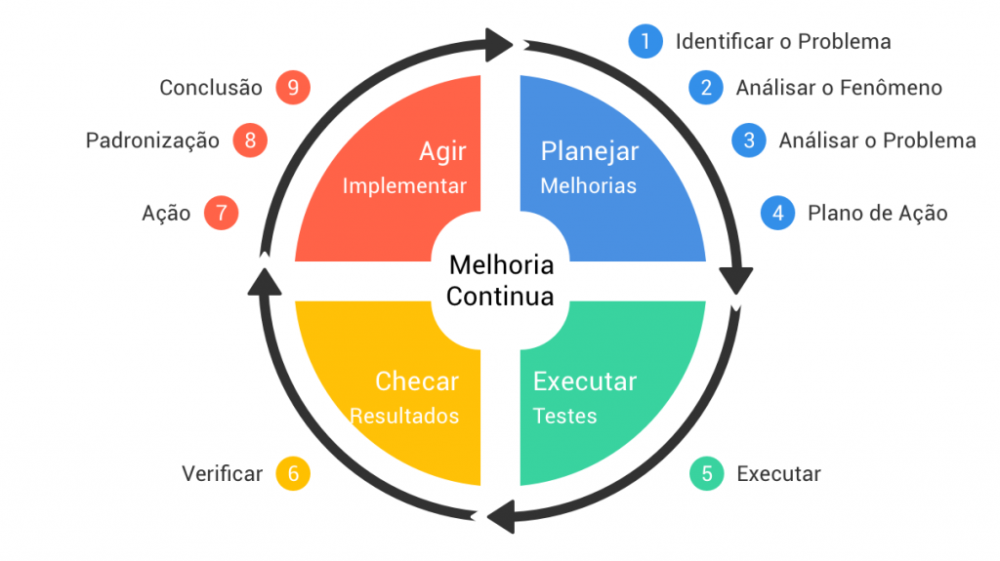

- Analisar os Bigrams e Trigrams
- Clusterizar
- Sugerir musicas populares de artistas relacionados
- Prever se a musica vai ser popular baseado nas features
- Baixar a propria base de favoritos e montar um sistema de recomendacao baseado nas features das musicas do usuario.

# WebApp Análise de Dados de Artistas

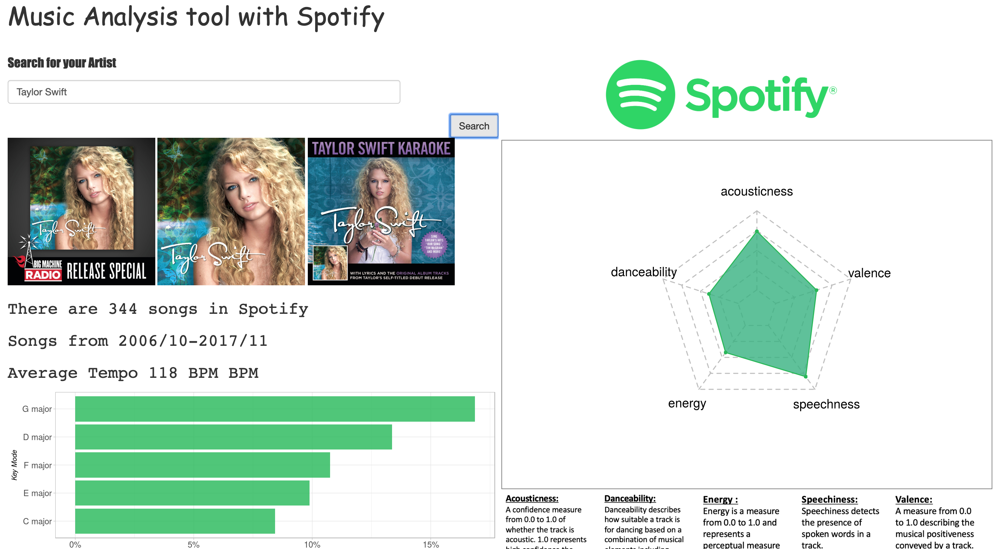

#Referências
Este projeto foi inspirado em gigantes no assunto, que contribuíram com seus artigos e video aulas para o meu aprendizado. Seguem alguns links para quem quiser buscar mais informações:

*   https://github.com/jmcabreira/A-Music-Taste-Analysis-Using-Spotify-API-and-Python.
*   https://github.com/DeaBardhoshi/Data-Science-Projects/blob/main/Music%20System.ipynb
*   https://medium.com/@maxtingle/getting-started-with-spotifys-api-spotipy-197c3dc6353b
*   https://developer.spotify.com/documentation/web-api/
*   https://realpython.com/python-nltk-sentiment-analysis/
*   https://minerandodados.com.br/curso-de-data-science/(Módulo de SVM(Support Vector Machine) do Curso Data Science do Zero)

